In [99]:
# AWS Imports
import sagemaker
from sagemaker import get_execution_role
import json
import boto3

sess = sagemaker.Session()

role = get_execution_role()
print(role) # Role that SageMaker would use to leverage AWS resources

bucket = sess.default_bucket() # Replace with your own bucket name if needed
print(bucket)
prefix = 'blazingtext/djia' # Replace with the prefix under which you want to store the data if needed

arn:aws:iam::418348025507:role/service-role/AmazonSageMaker-ExecutionRole-20221103T113909
sagemaker-us-east-1-418348025507


In [3]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 
import plotly.express as px
import plotly.graph_objects as go
import matplotlib 
%matplotlib inline 

In [4]:
df = pd.read_csv('Combined_News_DJIA.csv', encoding = 'ISO-8859-1')

In [5]:
df

,Date,Label,Top1,Top2,Top3,Top4,Top5,Top6,Top7,Top8,...,Top16,Top17,Top18,Top19,Top20,Top21,Top22,Top23,Top24,Top25
0,2008-08-08,0,"b""Georgia 'downs two Russian warplanes' as cou...",b'BREAKING: Musharraf to be impeached.',b'Russia Today: Columns of troops roll into So...,b'Russian tanks are moving towards the capital...,"b""Afghan children raped with 'impunity,' U.N. ...",b'150 Russian tanks have entered South Ossetia...,"b""Breaking: Georgia invades South Ossetia, Rus...","b""The 'enemy combatent' trials are nothing but...",...,b'Georgia Invades South Ossetia - if Russia ge...,b'Al-Qaeda Faces Islamist Backlash',"b'Condoleezza Rice: ""The US would not act to p...",b'This is a busy day: The European Union has ...,"b""Georgia will withdraw 1,000 soldiers from Ir...",b'Why the Pentagon Thinks Attacking Iran is a ...,b'Caucasus in crisis: Georgia invades South Os...,b'Indian shoe manufactory - And again in a se...,b'Visitors Suffering from Mental Illnesses Ban...,"b""No Help for Mexico's Kidnapping Surge"""
1,2008-08-11,1,b'Why wont America and Nato help us? If they w...,b'Bush puts foot down on Georgian conflict',"b""Jewish Georgian minister: Thanks to Israeli ...",b'Georgian army flees in disarray as Russians ...,"b""Olympic opening ceremony fireworks 'faked'""",b'What were the Mossad with fraudulent New Zea...,b'Russia angered by Israeli military sale to G...,b'An American citizen living in S.Ossetia blam...,...,b'Israel and the US behind the Georgian aggres...,"b'""Do not believe TV, neither Russian nor Geor...",b'Riots are still going on in Montreal (Canada...,b'China to overtake US as largest manufacturer',b'War in South Ossetia [PICS]',b'Israeli Physicians Group Condemns State Tort...,b' Russia has just beaten the United States ov...,b'Perhaps *the* question about the Georgia - R...,b'Russia is so much better at war',"b""So this is what it's come to: trading sex fo..."
2,2008-08-12,0,b'Remember that adorable 9-year-old who sang a...,"b""Russia 'ends Georgia operation'""","b'""If we had no sexual harassment we would hav...","b""Al-Qa'eda is losing support in Iraq because ...",b'Ceasefire in Georgia: Putin Outmaneuvers the...,b'Why Microsoft and Intel tried to kill the XO...,b'Stratfor: The Russo-Georgian War and the Bal...,"b""I'm Trying to Get a Sense of This Whole Geor...",...,b'U.S. troops still in Georgia (did you know t...,b'Why Russias response to Georgia was right',"b'Gorbachev accuses U.S. of making a ""serious ...","b'Russia, Georgia, and NATO: Cold War Two'",b'Remember that adorable 62-year-old who led y...,b'War in Georgia: The Israeli connection',b'All signs point to the US encouraging Georgi...,b'Christopher King argues that the US and NATO...,b'America: The New Mexico?',"b""BBC NEWS | Asia-Pacific | Extinction 'by man..."
3,2008-08-13,0,b' U.S. refuses Israel weapons to attack Iran:...,"b""When the president ordered to attack Tskhinv...",b' Israel clears troops who killed Reuters cam...,b'Britain\'s policy of being tough on drugs is...,b'Body of 14 year old found in trunk; Latest (...,b'China has moved 10 *million* quake survivors...,"b""Bush announces Operation Get All Up In Russi...",b'Russian forces sink Georgian ships ',...,b'Elephants extinct by 2020?',b'US humanitarian missions soon in Georgia - i...,"b""Georgia's DDOS came from US sources""","b'Russian convoy heads into Georgia, violating...",b'Israeli defence minister: US against strike ...,b'Gorbachev: We Had No Choice',b'Witness: Russian forces head towards Tbilisi...,b' Quarter of Russians blame U.S. for conflict...,b'Georgian president says US military will ta...,b'2006: Nobel laureate Aleksander Solzhenitsyn...
4,2008-08-14,1,b'All the experts admit that we should legalis...,b'War in South Osetia - 89 pictures made by a ...,b'Swedish wrestler Ara Abrahamian throws away ...,b'Russia exaggerated the death toll in South O...,b'Missile That Killed 9 Inside Pakistan May Ha...,"b""Rushdie Condemns Random House's Refusal to P...",b'Poland and US agree 

In [6]:
# Renaming column names for ease of access
list_1 = [i for i in range(27)]
new_idx = [str(i) for i in list_1]
df.columns= new_idx
df

,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,25,26
0,2008-08-08,0,"b""Georgia 'downs two Russian warplanes' as cou...",b'BREAKING: Musharraf to be impeached.',b'Russia Today: Columns of troops roll into So...,b'Russian tanks are moving towards the capital...,"b""Afghan children raped with 'impunity,' U.N. ...",b'150 Russian tanks have entered South Ossetia...,"b""Breaking: Georgia invades South Ossetia, Rus...","b""The 'enemy combatent' trials are nothing but...",...,b'Georgia Invades South Ossetia - if Russia ge...,b'Al-Qaeda Faces Islamist Backlash',"b'Condoleezza Rice: ""The US would not act to p...",b'This is a busy day: The European Union has ...,"b""Georgia will withdraw 1,000 soldiers from Ir...",b'Why the Pentagon Thinks Attacking Iran is a ...,b'Caucasus in crisis: Georgia invades South Os...,b'Indian shoe manufactory - And again in a se...,b'Visitors Suffering from Mental Illnesses Ban...,"b""No Help for Mexico's Kidnapping Surge"""
1,2008-08-11,1,b'Why wont America and Nato help us? If they w...,b'Bush puts foot down on Georgian conflict',"b""Jewish Georgian minister: Thanks to Israeli ...",b'Georgian army flees in disarray as Russians ...,"b""Olympic opening ceremony fireworks 'faked'""",b'What were the Mossad with fraudulent New Zea...,b'Russia angered by Israeli military sale to G...,b'An American citizen living in S.Ossetia blam...,...,b'Israel and the US behind the Georgian aggres...,"b'""Do not believe TV, neither Russian nor Geor...",b'Riots are still going on in Montreal (Canada...,b'China to overtake US as largest manufacturer',b'War in South Ossetia [PICS]',b'Israeli Physicians Group Condemns State Tort...,b' Russia has just beaten the United States ov...,b'Perhaps *the* question about the Georgia - R...,b'Russia is so much better at war',"b""So this is what it's come to: trading sex fo..."
2,2008-08-12,0,b'Remember that adorable 9-year-old who sang a...,"b""Russia 'ends Georgia operation'""","b'""If we had no sexual harassment we would hav...","b""Al-Qa'eda is losing support in Iraq because ...",b'Ceasefire in Georgia: Putin Outmaneuvers the...,b'Why Microsoft and Intel tried to kill the XO...,b'Stratfor: The Russo-Georgian War and the Bal...,"b""I'm Trying to Get a Sense of This Whole Geor...",...,b'U.S. troops still in Georgia (did you know t...,b'Why Russias response to Georgia was right',"b'Gorbachev accuses U.S. of making a ""serious ...","b'Russia, Georgia, and NATO: Cold War Two'",b'Remember that adorable 62-year-old who led y...,b'War in Georgia: The Israeli connection',b'All signs point to the US encouraging Georgi...,b'Christopher King argues that the US and NATO...,b'America: The New Mexico?',"b""BBC NEWS | Asia-Pacific | Extinction 'by man..."
3,2008-08-13,0,b' U.S. refuses Israel weapons to attack Iran:...,"b""When the president ordered to attack Tskhinv...",b' Israel clears troops who killed Reuters cam...,b'Britain\'s policy of being tough on drugs is...,b'Body of 14 year old found in trunk; Latest (...,b'China has moved 10 *million* quake survivors...,"b""Bush announces Operation Get All Up In Russi...",b'Russian forces sink Georgian ships ',...,b'Elephants extinct by 2020?',b'US humanitarian missions soon in Georgia - i...,"b""Georgia's DDOS came from US sources""","b'Russian convoy heads into Georgia, violating...",b'Israeli defence minister: US against strike ...,b'Gorbachev: We Had No Choice',b'Witness: Russian forces head towards Tbilisi...,b' Quarter of Russians blame U.S. for conflict...,b'Georgian president says US military will ta...,b'2006: Nobel laureate Aleksander Solzhenitsyn...
4,2008-08-14,1,b'All the experts admit that we should legalis...,b'War in South Osetia - 89 pictures made by a ...,b'Swedish wrestler Ara Abrahamian throws away ...,b'Russia exaggerated the death toll in South O...,b'Missile That Killed 9 Inside Pakistan May Ha...,"b""Rushdie Condemns Random House's Refusal to P...",b'Poland and US agree to missle defense deal. ...,"b'Will the Russians conquer Tbli

In [7]:
# Data cleaning
for i in new_idx:
    df[i].replace("b'", "", regex = True, inplace = True)
    df[i].replace('b"', "", regex = True, inplace = True)
    df[i].replace("'", "", regex = True, inplace = True)
    df[i].replace("&amp", "", regex = True, inplace = True)
    df[i].replace("U.N. ", "UN ", regex = True, inplace = True)
    df[i].replace("U.S. ", "US ", regex = True, inplace = True)
df

,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,25,26
0,2008-08-08,0,Georgia downs two Russian warplanes as countri...,BREAKING: Musharraf to be impeached.,Russia Today: Columns of troops roll into Sout...,Russian tanks are moving towards the capital o...,"Afghan children raped with impunity, UN offici...",150 Russian tanks have entered South Ossetia w...,"Breaking: Georgia invades South Ossetia, Russi...",The enemy combatent trials are nothing but a s...,...,Georgia Invades South Ossetia - if Russia gets...,Al-Qaeda Faces Islamist Backlash,"Condoleezza Rice: ""The US would not act to pre...",This is a busy day: The European Union has ap...,"Georgia will withdraw 1,000 soldiers from Iraq...",Why the Pentagon Thinks Attacking Iran is a Ba...,Caucasus in crisis: Georgia invades South Ossetia,Indian shoe manufactory - And again in a seri...,Visitors Suffering from Mental Illnesses Banne...,"No Help for Mexicos Kidnapping Surge"""
1,2008-08-11,1,Why wont America and Nato help us? If they won...,Bush puts foot down on Georgian conflict,Jewish Georgian minister: Thanks to Israeli tr...,Georgian army flees in disarray as Russians ad...,"Olympic opening ceremony fireworks faked""",What were the Mossad with fraudulent New Zeala...,Russia angered by Israeli military sale to Geo...,An American citizen living in S.Ossetia blames...,...,Israel and the US behind the Georgian aggression?,"""Do not believe TV, neither Russian nor Georgi...",Riots are still going on in Montreal (Canada) ...,China to overtake US as largest manufacturer,War in South Ossetia [PICS],Israeli Physicians Group Condemns State Torture,Russia has just beaten the United States over...,Perhaps *the* question about the Georgia - Rus...,Russia is so much better at war,So this is what its come to: trading sex for f...
2,2008-08-12,0,Remember that adorable 9-year-old who sang at ...,"Russia ends Georgia operation""","""If we had no sexual harassment we would have ...",Al-Qaeda is losing support in Iraq because of ...,Ceasefire in Georgia: Putin Outmaneuvers the West,Why Microsoft and Intel tried to kill the XO $...,Stratfor: The Russo-Georgian War and the Balan...,Im Trying to Get a Sense of This Whole Georgia...,...,US troops still in Georgia (did you know they ...,Why Russias response to Georgia was right,"Gorbachev accuses US of making a ""serious blun...","Russia, Georgia, and NATO: Cold War Two",Remember that adorable 62-year-old who led you...,War in Georgia: The Israeli connection,All signs point to the US encouraging Georgia ...,Christopher King argues that the US and NATO a...,America: The New Mexico?,BBC NEWS | Asia-Pacific | Extinction by man no...
3,2008-08-13,0,US refuses Israel weapons to attack Iran: report,When the president ordered to attack Tskhinval...,Israel clears troops who killed Reuters camer...,"Britain\s policy of being tough on drugs is ""p...",Body of 14 year old found in trunk; Latest (ra...,China has moved 10 *million* quake survivors i...,Bush announces Operation Get All Up In Russias...,Russian forces sink Georgian ships,...,Elephants extinct by 2020?,US humanitarian missions soon in Georgia - if ...,"Georgias DDOS came from US sources""","Russian convoy heads into Georgia, violating t...",Israeli defence minister: US against strike on...,Gorbachev: We Had No Choice,Witness: Russian forces head towards Tbilisi i...,Quarter of Russians blame US for conflict: poll,Georgian president says US military will take...,2006: Nobel laureate Aleksander Solzhenitsyn a...
4,2008-08-14,1,All the experts admit that we should legalise ...,War in South Osetia - 89 pictures made by a Ru...,Swedish wrestler Ara Abrahamian throws away me...,Russia exaggerated the death toll in South Oss...,Missile That Killed 9 Inside Pakistan May Have...,Rushdie Condemns Random Houses Refusal to Publ...,Poland and US agree to missle defense deal. In...,"Will the Russians conquer Tblisi? Bet on it, n...",...,Bank analyst forecast Georgian crisis 2 days e...,Georgia confict could 

# Data Analysis

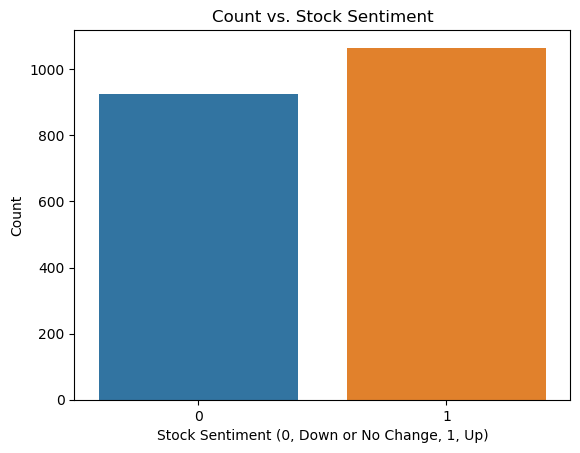

In [8]:
# Balanced dataset
sns.countplot(x = '1', data = df)
plt.xlabel('Stock Sentiment (0, Down or No Change, 1, Up)')
plt.ylabel('Count')
plt.title('Count vs. Stock Sentiment')
plt.show()

In [56]:
# Removing date column
df_proc = df.drop('0', axis=1)
df_proc

,1,2,3,4,5,6,7,8,9,10,...,17,18,19,20,21,22,23,24,25,26
0,0,Georgia downs two Russian warplanes as countri...,BREAKING: Musharraf to be impeached.,Russia Today: Columns of troops roll into Sout...,Russian tanks are moving towards the capital o...,"Afghan children raped with impunity, UN offici...",150 Russian tanks have entered South Ossetia w...,"Breaking: Georgia invades South Ossetia, Russi...",The enemy combatent trials are nothing but a s...,Georgian troops retreat from S. Osettain capit...,...,Georgia Invades South Ossetia - if Russia gets...,Al-Qaeda Faces Islamist Backlash,"Condoleezza Rice: ""The US would not act to pre...",This is a busy day: The European Union has ap...,"Georgia will withdraw 1,000 soldiers from Iraq...",Why the Pentagon Thinks Attacking Iran is a Ba...,Caucasus in crisis: Georgia invades South Ossetia,Indian shoe manufactory - And again in a seri...,Visitors Suffering from Mental Illnesses Banne...,"No Help for Mexicos Kidnapping Surge"""
1,1,Why wont America and Nato help us? If they won...,Bush puts foot down on Georgian conflict,Jewish Georgian minister: Thanks to Israeli tr...,Georgian army flees in disarray as Russians ad...,"Olympic opening ceremony fireworks faked""",What were the Mossad with fraudulent New Zeala...,Russia angered by Israeli military sale to Geo...,An American citizen living in S.Ossetia blames...,Welcome To World War IV! Now In High Definition!,...,Israel and the US behind the Georgian aggression?,"""Do not believe TV, neither Russian nor Georgi...",Riots are still going on in Montreal (Canada) ...,China to overtake US as largest manufacturer,War in South Ossetia [PICS],Israeli Physicians Group Condemns State Torture,Russia has just beaten the United States over...,Perhaps *the* question about the Georgia - Rus...,Russia is so much better at war,So this is what its come to: trading sex for f...
2,0,Remember that adorable 9-year-old who sang at ...,"Russia ends Georgia operation""","""If we had no sexual harassment we would have ...",Al-Qaeda is losing support in Iraq because of ...,Ceasefire in Georgia: Putin Outmaneuvers the West,Why Microsoft and Intel tried to kill the XO $...,Stratfor: The Russo-Georgian War and the Balan...,Im Trying to Get a Sense of This Whole Georgia...,The US military was surprised by the timing an...,...,US troops still in Georgia (did you know they ...,Why Russias response to Georgia was right,"Gorbachev accuses US of making a ""serious blun...","Russia, Georgia, and NATO: Cold War Two",Remember that adorable 62-year-old who led you...,War in Georgia: The Israeli connection,All signs point to the US encouraging Georgia ...,Christopher King argues that the US and NATO a...,America: The New Mexico?,BBC NEWS | Asia-Pacific | Extinction by man no...
3,0,US refuses Israel weapons to attack Iran: report,When the president ordered to attack Tskhinval...,Israel clears troops who killed Reuters camer...,"Britain\s policy of being tough on drugs is ""p...",Body of 14 year old found in trunk; Latest (ra...,China has moved 10 *million* quake survivors i...,Bush announces Operation Get All Up In Russias...,Russian forces sink Georgian ships,The commander of a Navy air reconnaissance squ...,...,Elephants extinct by 2020?,US humanitarian missions soon in Georgia - if ...,"Georgias DDOS came from US sources""","Russian convoy heads into Georgia, violating t...",Israeli defence minister: US against strike on...,Gorbachev: We Had No Choice,Witness: Russian forces head towards Tbilisi i...,Quarter of Russians blame US for conflict: poll,Georgian president says US military will take...,2006: Nobel laureate Aleksander Solzhenitsyn a...
4,1,All the experts admit that we should legalise ...,War in South Osetia - 89 pictures made by a Ru...,Swedish wrestler Ara Abrahamian throws away me...,Russia exaggerated the death toll in South Oss...,Missile That Killed 9 Inside Pakistan May Have...,Rushdie Condemns Random Houses Refusal to Publ...,Poland and US agree to missle def

In [57]:
# Transforming data into two columns
data_arr = []
for row in df_proc.values:
    sentiment = row[0]
    for headline in row:
        if (headline is not sentiment) or (headline is not sentiment):
            data_arr.append([sentiment, headline])

In [58]:
# Converting array to new dataframe
np_arr = np.array(data_arr)
conv_df = pd.DataFrame(np_arr, columns = ['sentiment','headline'])
conv_df

,sentiment,headline
0,0,Georgia downs two Russian warplanes as countri...
1,0,BREAKING: Musharraf to be impeached.
2,0,Russia Today: Columns of troops roll into Sout...
3,0,Russian tanks are moving towards the capital o...
4,0,"Afghan children raped with impunity, UN offici..."
...,...,...
49720,1,Philippines president Rodrigo Duterte urges pe...
49721,1,Spain arrests three Pakistanis accused of prom...
49722,1,"Venezuela, where anger over food shortages is ..."
49723,1,A Hindu temple worker has been killed by three...


In [59]:
conv_df['char_len'] = conv_df['headline'].astype(str).apply(len)
conv_df['word_count'] = conv_df['headline'].apply(lambda x: len(str(x).split()))
conv_df

,sentiment,headline,char_len,word_count
0,0,Georgia downs two Russian warplanes as countri...,70,12
1,0,BREAKING: Musharraf to be impeached.,36,5
2,0,Russia Today: Columns of troops roll into Sout...,88,13
3,0,Russian tanks are moving towards the capital o...,136,20
4,0,"Afghan children raped with impunity, UN offici...",117,22
...,...,...,...,...
49720,1,Philippines president Rodrigo Duterte urges pe...,193,34
49721,1,Spain arrests three Pakistanis accused of prom...,61,8
49722,1,"Venezuela, where anger over food shortages is ...",258,42
49723,1,A Hindu temple worker has been killed by three...,300,47


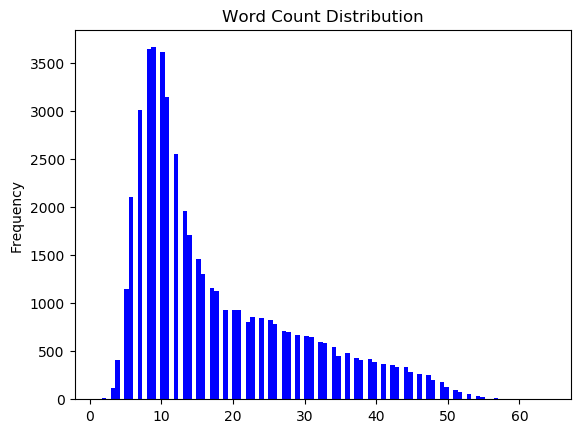

In [60]:
conv_df['word_count'].plot(
    kind='hist',
    bins=100,
    color="Blue",
    title='Word Count Distribution')
plt.show()

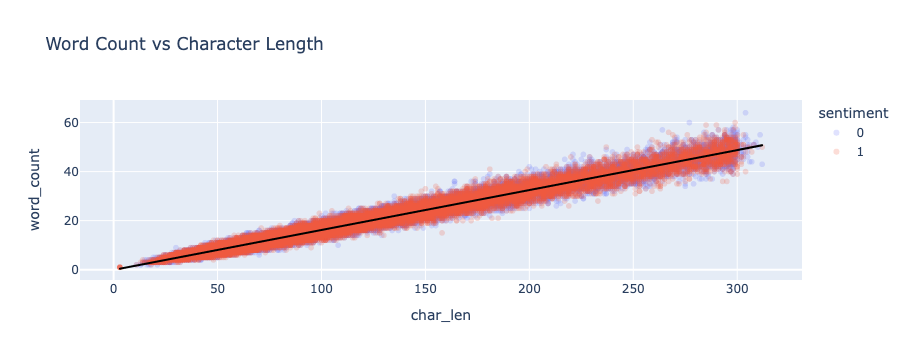

In [61]:
fig = px.scatter(conv_df, x="char_len", y="word_count", color='sentiment', opacity=0.2, trendline="ols", 
                 trendline_color_override="Black", title="Word Count vs Character Length")
fig.show()

# Data Processing for Models

In [8]:
# Dividing train and test by date
train_data = df[df['0'] < '20150101']
test_data = df[df['0'] > '20141231']

In [9]:
# Removing punctuations
X_train = train_data.iloc[:,2:27]
X_train.replace("[^a-zA-Z]"," ",regex=True, inplace=True)

# Renaming column names for ease of access
list_1 = [i for i in range(25)]
new_idx = [str(i) for i in list_1]
X_train.columns= new_idx
X_train

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
0,Georgia downs two Russian warplanes as countri...,BREAKING Musharraf to be impeached,Russia Today Columns of troops roll into Sout...,Russian tanks are moving towards the capital o...,Afghan children raped with impunity UN offici...,Russian tanks have entered South Ossetia w...,Breaking Georgia invades South Ossetia Russi...,The enemy combatent trials are nothing but a s...,Georgian troops retreat from S Osettain capit...,Did the US Prep Georgia for War with Russia,...,Georgia Invades South Ossetia if Russia gets...,Al Qaeda Faces Islamist Backlash,Condoleezza Rice The US would not act to pre...,This is a busy day The European Union has ap...,Georgia will withdraw soldiers from Iraq...,Why the Pentagon Thinks Attacking Iran is a Ba...,Caucasus in crisis Georgia invades South Ossetia,Indian shoe manufactory And again in a seri...,Visitors Suffering from Mental Illnesses Banne...,No Help for Mexicos Kidnapping Surge
1,Why wont America and Nato help us If they won...,Bush puts foot down on Georgian conflict,Jewish Georgian minister Thanks to Israeli tr...,Georgian army flees in disarray as Russians ad...,Olympic opening ceremony fireworks faked,What were the Mossad with fraudulent New Zeala...,Russia angered by Israeli military sale to Geo...,An American citizen living in S Ossetia blames...,Welcome To World War IV Now In High Definition,Georgias move a mistake of monumental proport...,...,Israel and the US behind the Georgian aggression,Do not believe TV neither Russian nor Georgi...,Riots are still going on in Montreal Canada ...,China to overtake US as largest manufacturer,War in South Ossetia PICS,Israeli Physicians Group Condemns State Torture,Russia has just beaten the United States over...,Perhaps the question about the Georgia Rus...,Russia is so much better at war,So this is what its come to trading sex for f...
2,Remember that adorable year old who sang at ...,Russia ends Georgia operation,If we had no sexual harassment we would have ...,Al Qaeda is losing support in Iraq because of ...,Ceasefire in Georgia Putin Outmaneuvers the West,Why Microsoft and Intel tried to kill the XO ...,Stratfor The Russo Georgian War and the Balan...,Im Trying to Get a Sense of This Whole Georgia...,The US military was surprised by the timing an...,US Beats War Drum as Iran Dumps the Dollar,...,US troops still in Georgia did you know they ...,Why Russias response to Georgia was right,Gorbachev accuses US of making a serious blun...,Russia Georgia and NATO Cold War Two,Remember that adorable year old who led you...,War in Georgia The Israeli connection,All signs point to the US encouraging Georgia ...,Christopher King argues that the US and NATO a...,America The New Mexico,BBC NEWS Asia Pacific Extinction by man no...
3,US refuses Israel weapons to attack Iran report,When the president ordered to attack Tskhinval...,Israel clears troops who killed Reuters camer...,Britain s policy of being tough on drugs is p...,Body of year old found in trunk Latest ra...,China has moved million quake survivors i...,Bush announces Operation Get All Up In Russias...,Russian forces sink Georgian ships,The commander of a Navy air reconnaissance squ...,of CNN readers Russias actions in Georgia...,...,Elephants extinct by,US humanitarian missions soon in Georgia if ...,Georgias DDOS came from US sources,Russian convoy heads into Georgia violating t...,Israeli defence minister US against strike on...,Gorbachev We Had No Choice,Witness Russian forces head towards Tbilisi i...,Quarter of Russians blame US for conflict poll,Georgian president says US military will take...,Nobel laureate Aleksander Solzhenitsyn a...
4,All the experts admit that we should legalise ...,War in South Osetia pictures made by a Ru...,Swedish wrestler Ara Abrahamian throws away me...,Russia exaggerated the death toll in South Oss...,Missile That Killed Inside Pakistan May Have...,Rushdie Condemns Random Houses Refusal to Publ...,Pola

In [10]:
# Convertng headlines to lower case
for i in new_idx:
    X_train[i] = X_train[i].str.lower()
X_train

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
0,georgia downs two russian warplanes as countri...,breaking musharraf to be impeached,russia today columns of troops roll into sout...,russian tanks are moving towards the capital o...,afghan children raped with impunity un offici...,russian tanks have entered south ossetia w...,breaking georgia invades south ossetia russi...,the enemy combatent trials are nothing but a s...,georgian troops retreat from s osettain capit...,did the us prep georgia for war with russia,...,georgia invades south ossetia if russia gets...,al qaeda faces islamist backlash,condoleezza rice the us would not act to pre...,this is a busy day the european union has ap...,georgia will withdraw soldiers from iraq...,why the pentagon thinks attacking iran is a ba...,caucasus in crisis georgia invades south ossetia,indian shoe manufactory and again in a seri...,visitors suffering from mental illnesses banne...,no help for mexicos kidnapping surge
1,why wont america and nato help us if they won...,bush puts foot down on georgian conflict,jewish georgian minister thanks to israeli tr...,georgian army flees in disarray as russians ad...,olympic opening ceremony fireworks faked,what were the mossad with fraudulent new zeala...,russia angered by israeli military sale to geo...,an american citizen living in s ossetia blames...,welcome to world war iv now in high definition,georgias move a mistake of monumental proport...,...,israel and the us behind the georgian aggression,do not believe tv neither russian nor georgi...,riots are still going on in montreal canada ...,china to overtake us as largest manufacturer,war in south ossetia pics,israeli physicians group condemns state torture,russia has just beaten the united states over...,perhaps the question about the georgia rus...,russia is so much better at war,so this is what its come to trading sex for f...
2,remember that adorable year old who sang at ...,russia ends georgia operation,if we had no sexual harassment we would have ...,al qaeda is losing support in iraq because of ...,ceasefire in georgia putin outmaneuvers the west,why microsoft and intel tried to kill the xo ...,stratfor the russo georgian war and the balan...,im trying to get a sense of this whole georgia...,the us military was surprised by the timing an...,us beats war drum as iran dumps the dollar,...,us troops still in georgia did you know they ...,why russias response to georgia was right,gorbachev accuses us of making a serious blun...,russia georgia and nato cold war two,remember that adorable year old who led you...,war in georgia the israeli connection,all signs point to the us encouraging georgia ...,christopher king argues that the us and nato a...,america the new mexico,bbc news asia pacific extinction by man no...
3,us refuses israel weapons to attack iran report,when the president ordered to attack tskhinval...,israel clears troops who killed reuters camer...,britain s policy of being tough on drugs is p...,body of year old found in trunk latest ra...,china has moved million quake survivors i...,bush announces operation get all up in russias...,russian forces sink georgian ships,the commander of a navy air reconnaissance squ...,of cnn readers russias actions in georgia...,...,elephants extinct by,us humanitarian missions soon in georgia if ...,georgias ddos came from us sources,russian convoy heads into georgia violating t...,israeli defence minister us against strike on...,gorbachev we had no choice,witness russian forces head towards tbilisi i...,quarter of russians blame us for conflict poll,georgian president says us military will take...,nobel laureate aleksander solzhenitsyn a...
4,all the experts admit that we should legalise ...,war in south osetia pictures made by a ru...,swedish wrestler ara abrahamian throws away me...,russia exaggerated the death toll in south oss...,missile that killed inside pakistan may have...,rushdie condemns random houses refusal to publ...,pola

In [11]:
headlines = []
for row in range(0, len(X_train.index)):
    headlines.append(' '.join(str(x) for x in X_train.iloc[row,0:25]))
headlines[0]

'georgia downs two russian warplanes as countries move to brink of war  breaking  musharraf to be impeached  russia today  columns of troops roll into south ossetia  footage from fighting  youtube  russian tanks are moving towards the capital of south ossetia  which has reportedly been completely destroyed by georgian artillery fire afghan children raped with impunity  un official says   this is sick  a three year old was raped and they do nothing      russian tanks have entered south ossetia whilst georgia shoots down two russian jets  breaking  georgia invades south ossetia  russia warned it would intervene on sos side  the enemy combatent trials are nothing but a sham  salim haman has been sentenced to       years  but will be kept longer anyway just because they feel like it   georgian troops retreat from s  osettain capital  presumably leaving several hundred people killed   video  did the us prep georgia for war with russia  rice gives green light for israel to attack iran  says 

In [13]:
# Row index 0 has a negative sentiment, row index 1 has a positive sentiment
train_data

,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,25,26
0,2008-08-08,0,Georgia downs two Russian warplanes as countri...,BREAKING: Musharraf to be impeached.,Russia Today: Columns of troops roll into Sout...,Russian tanks are moving towards the capital o...,"Afghan children raped with impunity, UN offici...",150 Russian tanks have entered South Ossetia w...,"Breaking: Georgia invades South Ossetia, Russi...",The enemy combatent trials are nothing but a s...,...,Georgia Invades South Ossetia - if Russia gets...,Al-Qaeda Faces Islamist Backlash,"Condoleezza Rice: ""The US would not act to pre...",This is a busy day: The European Union has ap...,"Georgia will withdraw 1,000 soldiers from Iraq...",Why the Pentagon Thinks Attacking Iran is a Ba...,Caucasus in crisis: Georgia invades South Ossetia,Indian shoe manufactory - And again in a seri...,Visitors Suffering from Mental Illnesses Banne...,"No Help for Mexicos Kidnapping Surge"""
1,2008-08-11,1,Why wont America and Nato help us? If they won...,Bush puts foot down on Georgian conflict,Jewish Georgian minister: Thanks to Israeli tr...,Georgian army flees in disarray as Russians ad...,"Olympic opening ceremony fireworks faked""",What were the Mossad with fraudulent New Zeala...,Russia angered by Israeli military sale to Geo...,An American citizen living in S.Ossetia blames...,...,Israel and the US behind the Georgian aggression?,"""Do not believe TV, neither Russian nor Georgi...",Riots are still going on in Montreal (Canada) ...,China to overtake US as largest manufacturer,War in South Ossetia [PICS],Israeli Physicians Group Condemns State Torture,Russia has just beaten the United States over...,Perhaps *the* question about the Georgia - Rus...,Russia is so much better at war,So this is what its come to: trading sex for f...
2,2008-08-12,0,Remember that adorable 9-year-old who sang at ...,"Russia ends Georgia operation""","""If we had no sexual harassment we would have ...",Al-Qaeda is losing support in Iraq because of ...,Ceasefire in Georgia: Putin Outmaneuvers the West,Why Microsoft and Intel tried to kill the XO $...,Stratfor: The Russo-Georgian War and the Balan...,Im Trying to Get a Sense of This Whole Georgia...,...,US troops still in Georgia (did you know they ...,Why Russias response to Georgia was right,"Gorbachev accuses US of making a ""serious blun...","Russia, Georgia, and NATO: Cold War Two",Remember that adorable 62-year-old who led you...,War in Georgia: The Israeli connection,All signs point to the US encouraging Georgia ...,Christopher King argues that the US and NATO a...,America: The New Mexico?,BBC NEWS | Asia-Pacific | Extinction by man no...
3,2008-08-13,0,US refuses Israel weapons to attack Iran: report,When the president ordered to attack Tskhinval...,Israel clears troops who killed Reuters camer...,"Britain\s policy of being tough on drugs is ""p...",Body of 14 year old found in trunk; Latest (ra...,China has moved 10 *million* quake survivors i...,Bush announces Operation Get All Up In Russias...,Russian forces sink Georgian ships,...,Elephants extinct by 2020?,US humanitarian missions soon in Georgia - if ...,"Georgias DDOS came from US sources""","Russian convoy heads into Georgia, violating t...",Israeli defence minister: US against strike on...,Gorbachev: We Had No Choice,Witness: Russian forces head towards Tbilisi i...,Quarter of Russians blame US for conflict: poll,Georgian president says US military will take...,2006: Nobel laureate Aleksander Solzhenitsyn a...
4,2008-08-14,1,All the experts admit that we should legalise ...,War in South Osetia - 89 pictures made by a Ru...,Swedish wrestler Ara Abrahamian throws away me...,Russia exaggerated the death toll in South Oss...,Missile That Killed 9 Inside Pakistan May Have...,Rushdie Condemns Random Houses Refusal to Publ...,Poland and US agree to missle defense deal. In...,"Will the Russians conquer Tblisi? Bet on it, n...",...,Bank analyst forecast Georgian crisis 2 days e...,Georgia confict could 

In [85]:
!pip install wordcloud
from wordcloud import WordCloud


[notice] A new release of pip available: 22.2.2 -> 22.3
[notice] To update, run: pip install --upgrade pip


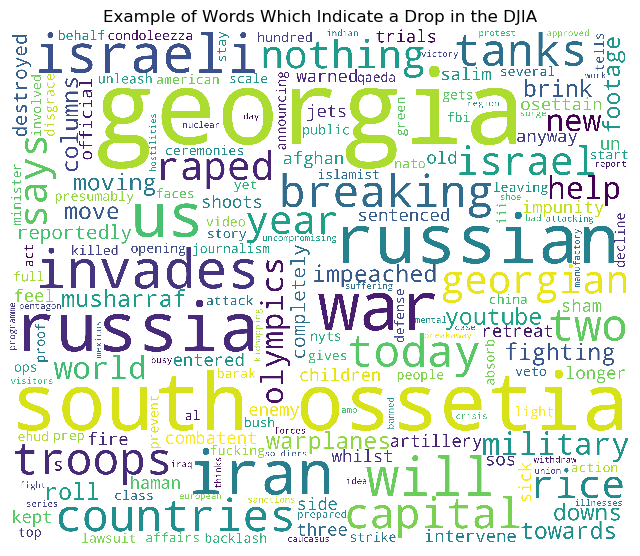

In [86]:
word_cloud_1 = WordCloud(background_color='white', width=3000, height=2500).generate(headlines[0])
plt.figure(figsize=(8,8))
plt.imshow(word_cloud_1)
plt.axis('off')
plt.title("Example of Words Which Indicate a Drop in the DJIA")
plt.show()

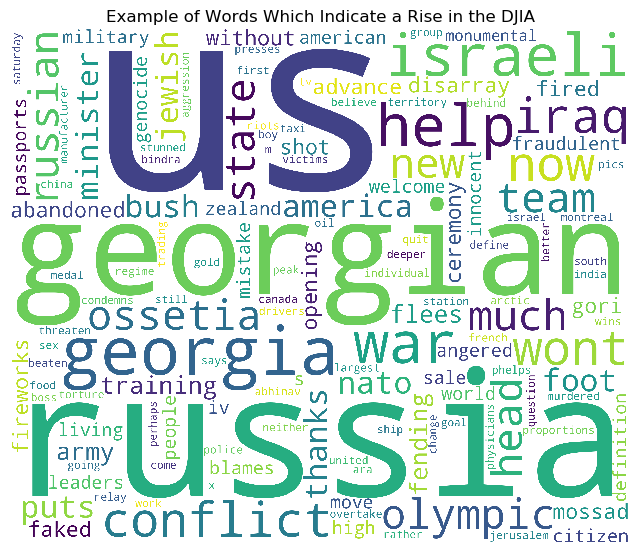

In [88]:
word_cloud_2 = WordCloud(background_color='white', width=3000, height=2500).generate(headlines[1])
plt.figure(figsize=(8,8))
plt.imshow(word_cloud_2)
plt.axis('off')
plt.title("Example of Words Which Indicate a Rise in the DJIA")
plt.show()

# Train and Test Models

## Random Forest Classifier (Count Vectorizer and TF-IDF)

### Count Vectorizer

In [12]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

In [16]:
# CountVectorizer implements bag of words

c_vec = CountVectorizer(ngram_range=(2,2))
cv_X_train = c_vec.fit_transform(headlines)

In [18]:
%%time
# Random Forest Classifier

rf_classifier = RandomForestClassifier(n_estimators=200,criterion='entropy')
rf_classifier.fit(cv_X_train, train_data['1'])

CPU times: user 15.4 s, sys: 24 ms, total: 15.4 s
Wall time: 15.6 s


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [19]:
%%time
# Predict for the test dataset

test_headlines = []

for row in range(0, len(test_data.index)):
    test_headlines.append(' '.join(str(x) for x in test_data.iloc[row,2:27]))
    
test_dataset = c_vec.transform(test_headlines)
predictions = rf_classifier.predict(test_dataset)

CPU times: user 572 ms, sys: 95 µs, total: 572 ms
Wall time: 572 ms


In [102]:
rf_matrix = confusion_matrix(test_data['1'], predictions)
rf_score = accuracy_score(test_data['1'], predictions)
print(f"Accuracy score is: {rf_score * 100}%")
rf_report = classification_report(test_data['1'], predictions)
print(rf_report)

Accuracy score is: 85.71428571428571%
              precision    recall  f1-score   support

           0       1.00      0.71      0.83       186
           1       0.78      1.00      0.88       192

    accuracy                           0.86       378
   macro avg       0.89      0.85      0.85       378
weighted avg       0.89      0.86      0.85       378



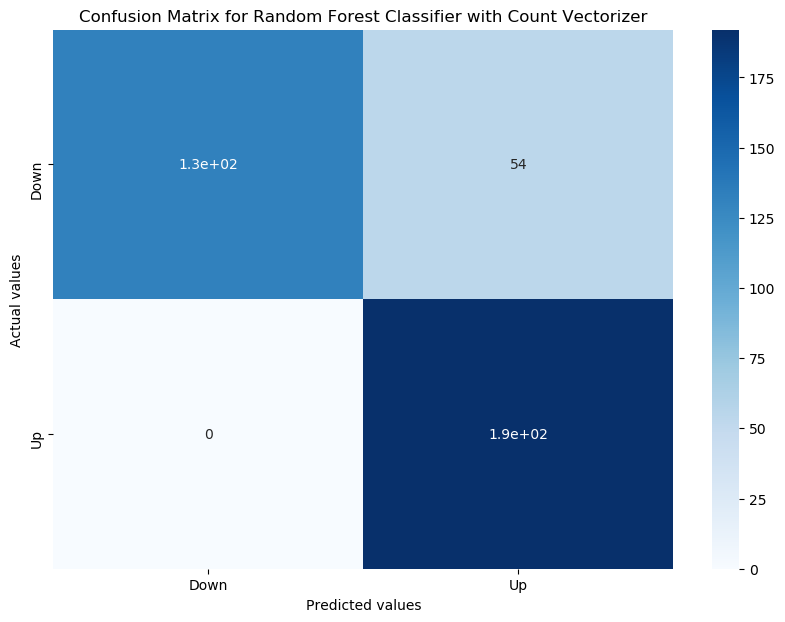

In [109]:
plt.figure(figsize=(10,7))
sns.heatmap(data=rf_matrix, annot=True, cmap="Blues", xticklabels=['Down', 'Up'], yticklabels=['Down', 'Up'])
plt.xlabel('Predicted values')
plt.ylabel('Actual values')
plt.title('Confusion Matrix for Random Forest Classifier with Count Vectorizer')
plt.show()

### Term Frequency Inverse Document Frequency (TF-IDF)

In [104]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [105]:
tfidf_vec = TfidfVectorizer(ngram_range=(2,2))
tfidf_X_train = tfidf_vec.fit_transform(headlines)

In [106]:
%%time
# Random Forest Classifier

rf_classifier_tfidf = RandomForestClassifier(n_estimators=200,criterion='entropy')
rf_classifier_tfidf.fit(tfidf_X_train, train_data['1'])

CPU times: user 13.9 s, sys: 0 ns, total: 13.9 s
Wall time: 14.4 s


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [107]:
%%time
# Predict for the test dataset

test_headlines = []

for row in range(0, len(test_data.index)):
    test_headlines.append(' '.join(str(x) for x in test_data.iloc[row,2:27]))
    
test_dataset = tfidf_vec.transform(test_headlines)
predictions = rf_classifier_tfidf.predict(test_dataset)

CPU times: user 617 ms, sys: 165 µs, total: 617 ms
Wall time: 756 ms


In [111]:
rf_matrix_tfidf = confusion_matrix(test_data['1'], predictions)
rf_score_tfidf = accuracy_score(test_data['1'], predictions)
print(f"Accuracy score is: {rf_score_tfidf * 100}%")
rf_report_tfidf = classification_report(test_data['1'], predictions)
print(rf_report)

Accuracy score is: 84.65608465608466%
              precision    recall  f1-score   support

           0       0.88      0.80      0.84       186
           1       0.82      0.90      0.86       192

    accuracy                           0.85       378
   macro avg       0.85      0.85      0.85       378
weighted avg       0.85      0.85      0.85       378



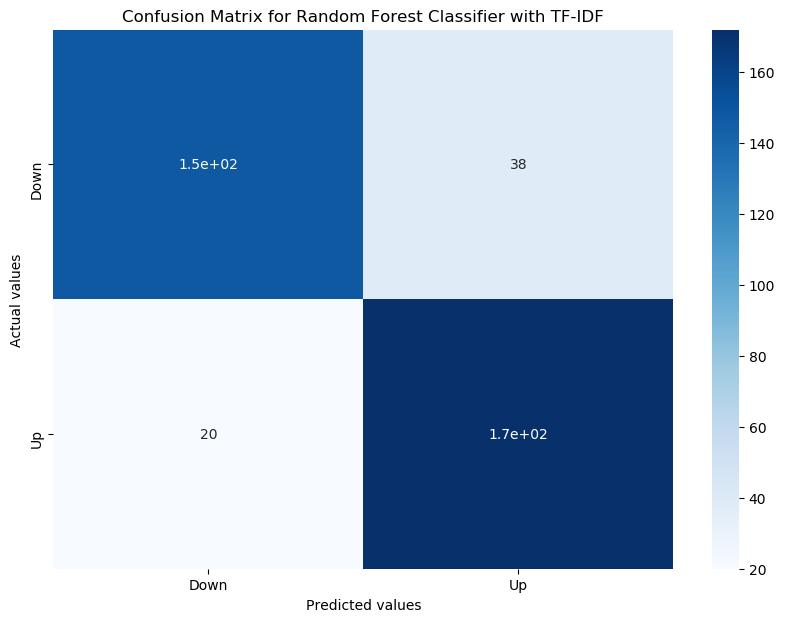

In [110]:
plt.figure(figsize=(10,7))
sns.heatmap(data=rf_matrix_tfidf, annot=True, cmap="Blues", xticklabels=['Down', 'Up'], yticklabels=['Down', 'Up'])
plt.xlabel('Predicted values')
plt.ylabel('Actual values')
plt.title('Confusion Matrix for Random Forest Classifier with TF-IDF')
plt.show()

# XGBoost (Count Vectorizer and TF-IDF)

## Count Vectorizer

In [113]:
!pip install xgboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 255.9/255.9 MB 2.9 MB/s eta 0:00:0000:0100:01

[notice] A new release of pip available: 22.2.2 -> 22.3
[notice] To update, run: pip install --upgrade pip


In [114]:
from xgboost import XGBClassifier

In [115]:
%%time
# Train dataset with XGBoost

xgb = XGBClassifier(random_state = 1)
xgb.fit(cv_X_train, train_data['1'])

CPU times: user 35.2 s, sys: 123 ms, total: 35.3 s
Wall time: 18.3 s


XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='binary:logistic',
              predictor='auto', random_state=1, reg_alpha=0, ...)

In [116]:
%%time
# Predict for the test dataset

test_headlines = []

for row in range(0, len(test_data.index)):
    test_headlines.append(' '.join(str(x) for x in test_data.iloc[row,2:27]))
    
test_dataset = c_vec.transform(test_headlines)
predictions = xgb.predict(test_dataset) 

CPU times: user 339 ms, sys: 21.6 ms, total: 361 ms
Wall time: 404 ms


In [117]:
xgb_matrix = confusion_matrix(test_data['1'], predictions)
xgb_score = accuracy_score(test_data['1'], predictions)
print(f"Accuracy score is: {xgb_score * 100}%")
xgb_report = classification_report(test_data['1'], predictions)
print(xgb_report)

Accuracy score is: 83.33333333333334%
              precision    recall  f1-score   support

           0       0.84      0.82      0.83       186
           1       0.83      0.85      0.84       192

    accuracy                           0.83       378
   macro avg       0.83      0.83      0.83       378
weighted avg       0.83      0.83      0.83       378



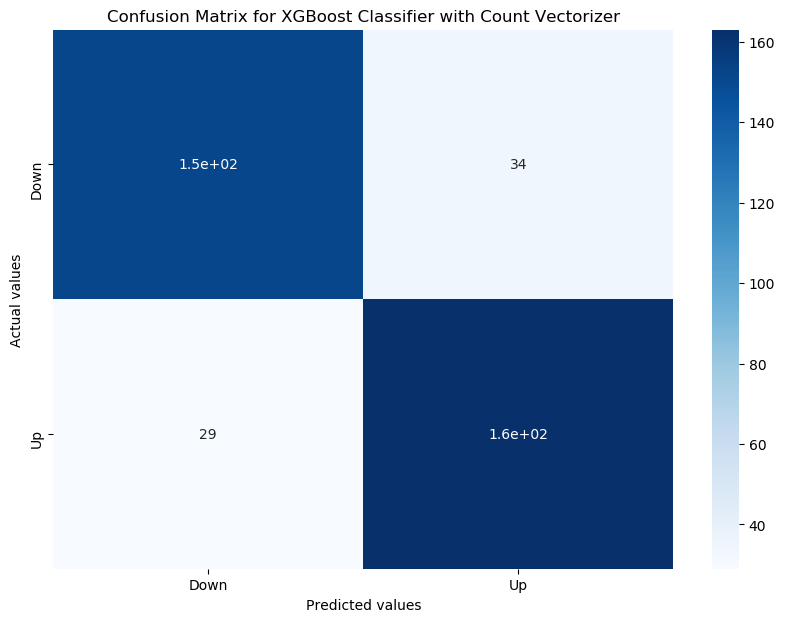

In [124]:
plt.figure(figsize=(10,7))
sns.heatmap(data=xgb_matrix, annot=True, cmap="Blues", xticklabels=['Down', 'Up'], yticklabels=['Down', 'Up'])
plt.xlabel('Predicted values')
plt.ylabel('Actual values')
plt.title('Confusion Matrix for XGBoost Classifier with Count Vectorizer')
plt.show()

## Term Frequency Inverse Document Frequency (TF-IDF)

In [119]:
%%time
# Train dataset with XGBoost

xgb_tfidf = XGBClassifier(random_state = 1)
xgb_tfidf.fit(tfidf_X_train, train_data['1'])

CPU times: user 51.8 s, sys: 182 ms, total: 52 s
Wall time: 27.1 s


XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='binary:logistic',
              predictor='auto', random_state=1, reg_alpha=0, ...)

In [120]:
%%time
# Predict for the test dataset

test_headlines = []

for row in range(0, len(test_data.index)):
    test_headlines.append(' '.join(str(x) for x in test_data.iloc[row,2:27]))
    
test_dataset = tfidf_vec.transform(test_headlines)
predictions = xgb_tfidf.predict(test_dataset) 

CPU times: user 339 ms, sys: 25.8 ms, total: 365 ms
Wall time: 411 ms


In [121]:
xgb_matrix_tfidf = confusion_matrix(test_data['1'], predictions)
xgb_score_tfidf = accuracy_score(test_data['1'], predictions)
print(f"Accuracy score is: {xgb_score_tfidf * 100}%")
xgb_report_tfidf = classification_report(test_data['1'], predictions)
print(xgb_report_tfidf)

Accuracy score is: 80.68783068783068%
              precision    recall  f1-score   support

           0       0.80      0.82      0.81       186
           1       0.82      0.80      0.81       192

    accuracy                           0.81       378
   macro avg       0.81      0.81      0.81       378
weighted avg       0.81      0.81      0.81       378



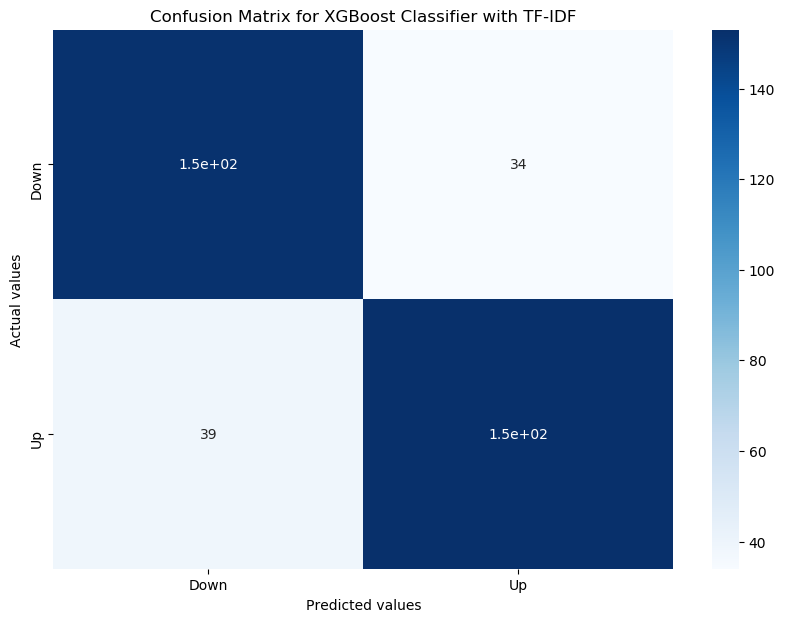

In [123]:
plt.figure(figsize=(10,7))
sns.heatmap(data=xgb_matrix_tfidf, annot=True, cmap="Blues", xticklabels=['Down', 'Up'], yticklabels=['Down', 'Up'])
plt.xlabel('Predicted values')
plt.ylabel('Actual values')
plt.title('Confusion Matrix for XGBoost Classifier with TF-IDF')
plt.show()

# Support Vector Machine (SVM) with Count Vectorizer

In [125]:
from sklearn.svm import SVC

In [126]:
%%time
# Train dataset with SVM

svm = SVC()
svm.fit(cv_X_train, train_data['1'])

CPU times: user 15 s, sys: 4.16 ms, total: 15 s
Wall time: 15.1 s


SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [127]:
%%time
# Predict for the test dataset

test_headlines = []

for row in range(0, len(test_data.index)):
    test_headlines.append(' '.join(str(x) for x in test_data.iloc[row,2:27]))
    
test_dataset = c_vec.transform(test_headlines)
predictions = svm.predict(test_dataset) 

CPU times: user 2.97 s, sys: 5.05 ms, total: 2.98 s
Wall time: 3.14 s


In [130]:
svm_matrix = confusion_matrix(test_data['1'], predictions)
svm_score = accuracy_score(test_data['1'], predictions)
print(f"Accuracy score is: {svm_score * 100}%")
svm_report = classification_report(test_data['1'], predictions)
print(svm_report)

Accuracy score is: 85.18518518518519%
              precision    recall  f1-score   support

           0       1.00      0.70      0.82       186
           1       0.77      1.00      0.87       192

    accuracy                           0.85       378
   macro avg       0.89      0.85      0.85       378
weighted avg       0.89      0.85      0.85       378



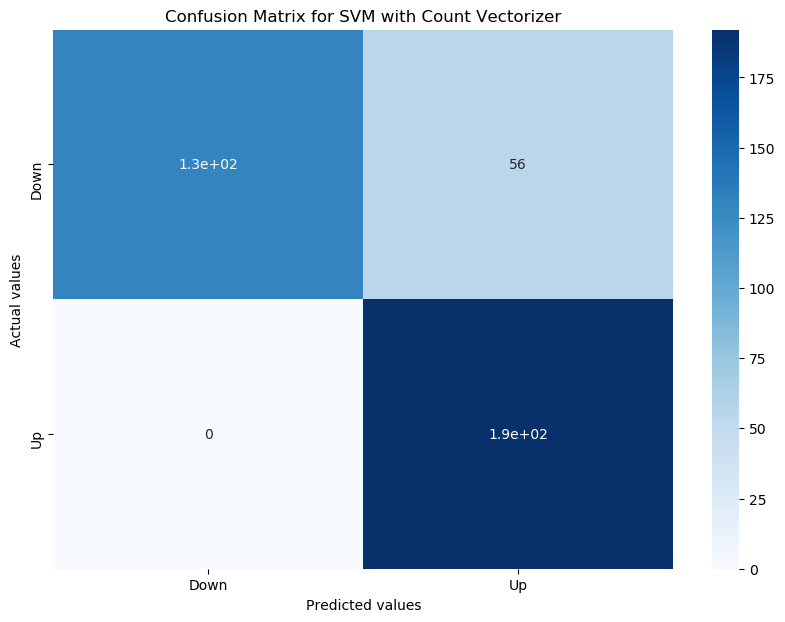

In [129]:
plt.figure(figsize=(10,7))
sns.heatmap(data=svm_matrix, annot=True, cmap="Blues", xticklabels=['Down', 'Up'], yticklabels=['Down', 'Up'])
plt.xlabel('Predicted values')
plt.ylabel('Actual values')
plt.title('Confusion Matrix for SVM with Count Vectorizer')
plt.show()

# BlazingText

## Data Processing

In [23]:
y_train = train_data['1']
y_train

0       0
1       1
2       0
3       0
4       1
       ..
1858    0
1859    0
1860    1
1861    0
1862    0
Name: 1, Length: 1863, dtype: int64

In [24]:
X_train = headlines
X_train[0]

'georgia downs two russian warplanes as countries move to brink of war  breaking  musharraf to be impeached  russia today  columns of troops roll into south ossetia  footage from fighting  youtube  russian tanks are moving towards the capital of south ossetia  which has reportedly been completely destroyed by georgian artillery fire afghan children raped with impunity  un official says   this is sick  a three year old was raped and they do nothing      russian tanks have entered south ossetia whilst georgia shoots down two russian jets  breaking  georgia invades south ossetia  russia warned it would intervene on sos side  the enemy combatent trials are nothing but a sham  salim haman has been sentenced to       years  but will be kept longer anyway just because they feel like it   georgian troops retreat from s  osettain capital  presumably leaving several hundred people killed   video  did the us prep georgia for war with russia  rice gives green light for israel to attack iran  says 

In [25]:
y_test = test_data['1']
X_test = test_headlines

In [26]:
df_y_train = pd.DataFrame(y_train) 
df_X_train = pd.DataFrame(X_train)
bt_train = pd.concat([df_y_train, df_X_train], axis=1, join='inner')

bt_train.columns.values[0] = "0"
bt_train.columns.values[1] = "1"

bt_train

,0,1
0,0,georgia downs two russian warplanes as countri...
1,1,why wont america and nato help us if they won...
2,0,remember that adorable year old who sang at ...
3,0,us refuses israel weapons to attack iran rep...
4,1,all the experts admit that we should legalise ...
...,...,...
1858,0,brazil declares emergency after babies a...
1859,0,germany recruits teachers to teach germa...
1860,1,pentagon thwarts obamas effort to close guanta...
1861,0,tech companies face criminal charges if they n...


In [27]:
df_y_test = pd.DataFrame(y_test) 
df_X_test = pd.DataFrame(X_test)

# Reset indicies for dataframe join
df_y_test.reset_index(drop=True, inplace=True)

bt_test = pd.concat([df_y_test, df_X_test], axis=1, join='inner')
bt_test.columns.values[0] = "0"
bt_test.columns.values[1] = "1"
bt_test

,0,1
0,1,Most cases of cancer are the result of sheer b...
1,0,Moscow-&gt;Beijing high speed train will reduc...
2,0,US oil falls below $50 a barrel Toyota gives a...
3,1,Shots fired at French magazine HQ 90% of Bibi ...
4,1,New Charlie Hebdo issue to come out next week:...
...,...,...
373,0,Barclays and RBS shares suspended from trading...
374,1,"2,500 Scientists To Australia: If You Want To ..."
375,1,Explosion At Airport In Istanbul Yemeni former...
376,1,Jamaica proposes marijuana dispensers for tour...


In [276]:
bt_train.to_csv('bt_train.csv', index = None)
bt_test.to_csv('bt_test.csv', index = None)

In [229]:
from random import shuffle
import multiprocessing
from multiprocessing import Pool
import csv
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [234]:
idx_to_sentiment = {'0': 'negative', '1': 'positive'}

In [240]:
def transform_instance(row):
    cur_row = []
    label = "__label__" + idx_to_sentiment[str(row[0])] # For BlazingText processing
    cur_row.append(label)
    cur_row.extend(nltk.word_tokenize(row[1]))
    return cur_row

In [241]:
def preprocess(input_file, output_file, keep=1):
    all_rows = []
    with open(input_file, 'r') as csvinfile:
        csv_reader = csv.reader(csvinfile, delimiter=',')
        for row in csv_reader:
            all_rows.append(row)
    shuffle(all_rows)
    all_rows = all_rows[:int(keep*len(all_rows))]
    pool = Pool(processes=multiprocessing.cpu_count())
    transformed_rows = pool.map(transform_instance, all_rows)
    pool.close() 
    pool.join()
    # BlazingText requires space-separated word tokens.
    with open(output_file, 'w') as csvoutfile:
        csv_writer = csv.writer(csvoutfile, delimiter=' ', lineterminator='\n') # notice the delimiter.
        csv_writer.writerows(transformed_rows)

## S3 Upload

In [243]:
# Processing train and test into csv files to store in S3
preprocess('bt_train.csv', 'bt.train')
preprocess('bt_test.csv', 'bt.test')

In [55]:
%%time
# Sends files to S3 bucket

train_channel = prefix + '/train'
test_channel = prefix + '/test'

sess.upload_data(path='bt.train', bucket=bucket, key_prefix=train_channel)
sess.upload_data(path='bt.test', bucket=bucket, key_prefix=test_channel)

s3_train_data = 's3://{}/{}'.format(bucket, train_channel)
s3_test_data = 's3://{}/{}'.format(bucket, test_channel)

CPU times: user 62.2 ms, sys: 27.9 ms, total: 90.1 ms
Wall time: 647 ms


In [50]:
# Where model artifact is dumped
s3_output_location = 's3://{}/{}/output'.format(bucket, prefix)
s3_output_location

's3://sagemaker-us-east-1-418348025507/blazingtext/djia/output'

In [13]:
region_name = boto3.Session().region_name
print(region_name)

us-east-1


In [247]:
container = sagemaker.amazon.amazon_estimator.get_image_uri(region_name, "blazingtext", "latest")
print('Using SageMaker BlazingText container: {} ({})'.format(container, region_name))

The method get_image_uri has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.
Defaulting to the only supported framework/algorithm version: 1. Ignoring framework/algorithm version: latest.


Using SageMaker BlazingText container: 811284229777.dkr.ecr.us-east-1.amazonaws.com/blazingtext:1 (us-east-1)


## Setting Up Training Model

In [248]:
bt_model = sagemaker.estimator.Estimator(container,
                                         role, 
                                         instance_count=1, 
                                         instance_type='ml.c5.4xlarge',
                                         volume_size = 30,
                                         max_run = 360000,
                                         input_mode= 'File',
                                         output_path=s3_output_location,
                                         sagemaker_session=sess)

In [249]:
bt_model.set_hyperparameters(mode="supervised",
                            epochs=10,
                            min_count=2,
                            learning_rate=0.05,
                            vector_dim=10,
                            early_stopping=True,
                            patience=4,
                            min_epochs=5,
                            word_ngrams=2)

In [250]:
from sagemaker.session import TrainingInput


train_data = sagemaker.inputs.TrainingInput(s3_train_data, distribution='FullyReplicated', content_type='text/plain')
test_data = sagemaker.inputs.TrainingInput(s3_test_data, distribution='FullyReplicated', content_type='text/plain')
data_channels = {'train': train_data, 'validation': test_data}

# Testing

In [251]:
bt_model.fit(inputs=data_channels, logs=True)

2022-11-07 22:09:23 Starting - Starting the training job...
2022-11-07 22:09:48 Starting - Preparing the instances for trainingProfilerReport-1667858963: InProgress
......
2022-11-07 22:10:48 Downloading - Downloading input data...
2022-11-07 22:11:22 Training - Training image download completed. Training in progress..Arguments: train
[11/07/2022 22:11:24 WARNING 139970449647424] Loggers have already been setup.
[11/07/2022 22:11:24 WARNING 139970449647424] Loggers have already been setup.
[11/07/2022 22:11:24 INFO 139970449647424] nvidia-smi took: 0.050275325775146484 secs to identify 0 gpus
[11/07/2022 22:11:24 INFO 139970449647424] Running single machine CPU BlazingText training using supervised mode.
Number of CPU sockets found in instance is  1
[11/07/2022 22:11:24 INFO 139970449647424] 2 files found in train channel. Using /opt/ml/input/data/train/djia.train for training...
[11/07/2022 22:11:24 INFO 139970449647424] Processing /opt/ml/input/data/train/djia.train . File size: 3.98

# Using XGBoost To Create An Endpoint

In [291]:
# XGBoost(83% accuracy) will be used instead of the trained Random Forest Model(85% accuracy)
# as AWS does not have an internal random forest classifier. It will be easier to implement XGBoost
# as an endpoint for the front end.

## Data Processing

In [110]:
# Have to manage the amount of features, otherwise resultant sparse matrix is too large for processing
vectorizer = CountVectorizer(ngram_range=(1, 1), max_features = 5000) # Reduced to single words
X_train_cv = vectorizer.fit_transform(headlines).toarray()
X_test_cv = vectorizer.transform(test_headlines).toarray()

In [111]:
# Renaming dataframes
y1 = df_y_train # Targets
X1 = pd.DataFrame(np.array(X_train_cv)) # Features
y2 = df_y_test
X2 = pd.DataFrame(np.array(X_test_cv))
print(X1.shape)
print(y1.shape)
print(X2.shape)
print(y2.shape)

(1863, 5000)
(1863, 1)
(378, 5000)
(378, 1)


In [69]:
y_train = np.array(y1)
X_train = np.array(X1)
y_test = np.array(y2)
X_test = np.array(X2)
print(y_train.shape)
print(X_train.shape)
print(y_test.shape)
print(X_test.shape)

(1863, 1)
(1863, 5000)
(378, 1)
(378, 5000)


In [162]:
# Convert the array into dataframe in a way that target variable is set as the first column and followed by feature columns
# Sagemaker built-in algorithm expects the data in this format.

train_data = pd.DataFrame({'Target': y_train[:,0]})
train_data = pd.concat((train_data, X1), axis = 1)
print(train_data.shape)
train_data

(1863, 5001)


,Target,0,1,2,3,4,5,6,7,8,...,4990,4991,4992,4993,4994,4995,4996,4997,4998,4999
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1858,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1859,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1860,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1861,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [163]:
val_data = pd.DataFrame({'Target':y_test[:,0]})
val_data = pd.concat((val_data, X2), axis = 1)
print(val_data.shape)
val_data

(378, 5001)


,Target,0,1,2,3,4,5,6,7,8,...,4990,4991,4992,4993,4994,4995,4996,4997,4998,4999
0,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
373,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
374,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
375,1,0,0,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,0,0,1
376,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [164]:
# Save train_data and validation_data as csv files.

train_data.to_csv('djia_train.csv', header = False, index = False)
val_data.to_csv('djia_validation.csv', header = False, index = False)

## Setup with S3

In [56]:
prefix = 'XGBoost-classifier'
key = 'XGBoost-classifier'
print(sess)
print(bucket)
print(role)
print(prefix)
print(key)

sagemaker-us-east-1-418348025507
arn:aws:iam::418348025507:role/service-role/AmazonSageMaker-ExecutionRole-20221103T113909
XGBoost-classifier
XGBoost-classifier


In [57]:
# read the data from csv file and then upload the data to s3 bucket
import os
with open('djia_train.csv','rb') as f:
    # The following code uploads the data into S3 bucket to be accessed later for training
    boto3.Session().resource('s3').Bucket(bucket).Object(os.path.join(prefix, 'train', key)).upload_fileobj(f)

# Let's print out the training data location in s3
s3_train_data = 's3://{}/{}/train/{}'.format(bucket, prefix, key)
print('Uploaded training data location: {}'.format(s3_train_data))

Uploaded training data location: s3://sagemaker-us-east-1-418348025507/XGBoost-classifier/train/XGBoost-classifier


In [58]:
with open('djia_validation.csv','rb') as f:
    boto3.Session().resource('s3').Bucket(bucket).Object(os.path.join(prefix, 'validation', key)).upload_fileobj(f)

s3_validation_data = 's3://{}/{}/validation/{}'.format(bucket, prefix, key)
print('uploaded validation data location: {}'.format(s3_validation_data))

uploaded validation data location: s3://sagemaker-us-east-1-418348025507/XGBoost-classifier/validation/XGBoost-classifier


In [59]:
output_location = 's3://{}/{}/output'.format(bucket, prefix)
print('Training artifacts will be uploaded to: {}'.format(output_location))

Training artifacts will be uploaded to: s3://sagemaker-us-east-1-418348025507/XGBoost-classifier/output


## Setup Training with XGBoost

In [60]:
from sagemaker.amazon.amazon_estimator import get_image_uri

container = sagemaker.image_uris.retrieve("xgboost", region_name, 'latest')

In [61]:
Xgboost_classifier = sagemaker.estimator.Estimator(container,
                                                   role, 
                                                   instance_count = 1, 
                                                   instance_type = 'ml.m4.xlarge',
                                                   output_path = output_location,
                                                   sagemaker_session = sess)

# To improve the performance of the model, a hyperparameters tuning job needs to be run 

Xgboost_classifier.set_hyperparameters(max_depth = 3,
                                       objective = 'multi:softmax',
                                       num_class = 2,
                                       eta = 0.5,
                                       num_round = 150)

In [62]:
train_input = sagemaker.session.TrainingInput(s3_data = s3_train_data, content_type='csv',s3_data_type = 'S3Prefix')
valid_input = sagemaker.session.TrainingInput(s3_data = s3_validation_data, content_type='csv',s3_data_type = 'S3Prefix')

data_channels = {'train': train_input,'validation': valid_input}

## Training and Validation

In [63]:
Xgboost_classifier.fit(data_channels)

2022-11-10 13:04:47 Starting - Starting the training job...ProfilerReport-1668085487: InProgress
...
2022-11-10 13:05:37 Starting - Preparing the instances for training............
2022-11-10 13:07:37 Downloading - Downloading input data...
2022-11-10 13:08:17 Training - Training image download completed. Training in progress...Arguments: train
[2022-11-10:13:08:28:INFO] Running standalone xgboost training.
[2022-11-10:13:08:28:INFO] File size need to be processed in the node: 21.38mb. Available memory size in the node: 8622.52mb
[2022-11-10:13:08:28:INFO] Determined delimiter of CSV input is ','
[13:08:28] S3DistributionType set as FullyReplicated
[13:08:28] 1863x5000 matrix with 9315000 entries loaded from /opt/ml/input/data/train?format=csv&label_column=0&delimiter=,
[2022-11-10:13:08:28:INFO] Determined delimiter of CSV input is ','
[13:08:28] S3DistributionType set as FullyReplicated
[13:08:28] 378x5000 matrix with 1890000 entries loaded from /opt/ml/input/data/validation?format=c

## Deploying Model To Perform Inference

In [64]:
predictor = Xgboost_classifier.deploy(initial_instance_count = 1, instance_type = "ml.m4.xlarge")

--------!

In [65]:
predictor.endpoint_name

'xgboost-2022-11-10-13-09-50-283'

In [66]:
from sagemaker.predictor import csv_serializer, json_deserializer
predictor.serializer = csv_serializer

In [70]:
predictions = predictor.predict(X_test)
predictions

The csv_serializer has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


b'1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.

In [71]:
# Converts the values in bytes format to array

def bytes_2_array(x):
    
    #makes entire prediction as string and splits based on ','
    l = str(x).split(',')
    
    #Since the first element contains unwanted characters like (b,',') we remove them
    l[0] = l[0][2:]
    #same-thing as above remove the unwanted last character (')
    l[-1] = l[-1][:-1]
    
    #iterating through the list of strings and converting them into float type
    for i in range(len(l)):
        l[i] = float(l[i])
        
    #converting the list to into array
    l = np.array(l).astype('float32')
    
    #reshape one-dimensional array to two-dimentaional array
    return l.reshape(-1,1)

In [72]:
predicted_values = bytes_2_array(predictions)
predicted_values[:50]

array([[1.],
       [0.],
       [0.],
       [1.],
       [1.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [0.],
       [1.],
       [0.],
       [0.],
       [1.],
       [0.],
       [1.],
       [1.],
       [1.],
       [1.],
       [0.],
       [0.],
       [1.],
       [0.],
       [1.],
       [1.],
       [1.],
       [0.],
       [0.],
       [1.],
       [0.],
       [1.],
       [1.],
       [0.],
       [0.],
       [1.],
       [0.],
       [0.],
       [1.],
       [0.],
       [1.],
       [0.],
       [0.],
       [1.],
       [0.],
       [1.]], dtype=float32)

In [73]:
from sklearn.metrics import precision_score, recall_score

print("Precision = {}".format(precision_score(y_test, predicted_values, average='macro')))
print("Recall = {}".format(recall_score(y_test, predicted_values, average='macro')))
print("Accuracy = {}".format(accuracy_score(y_test, predicted_values)))

Precision = 0.823329129886507
Recall = 0.8230846774193549
Accuracy = 0.8227513227513228


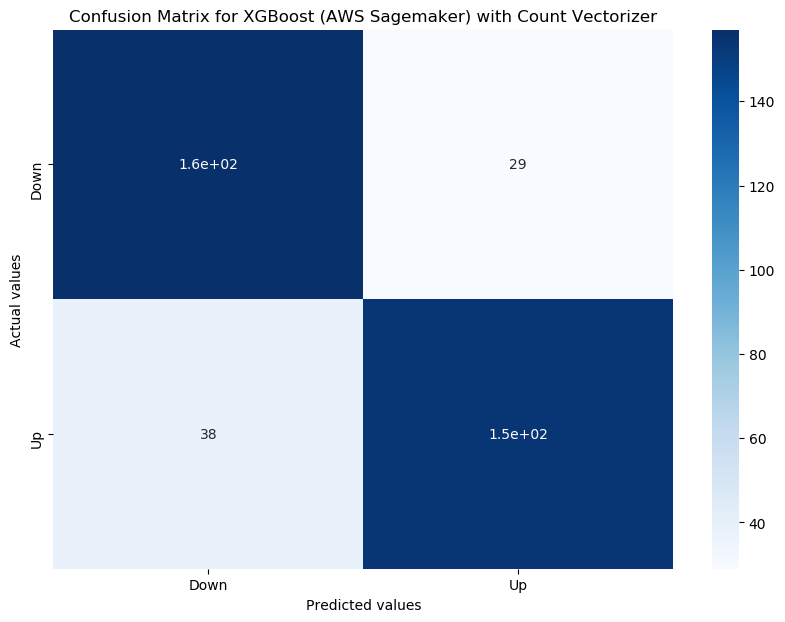

In [74]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, predicted_values)
plt.figure(figsize=(10,7))
sns.heatmap(data=cm, annot=True, cmap="Blues", xticklabels=['Down', 'Up'], yticklabels=['Down', 'Up'])
plt.xlabel('Predicted values')
plt.ylabel('Actual values')
plt.title('Confusion Matrix for XGBoost (AWS Sagemaker) with Count Vectorizer')
plt.show()

In [75]:
# Delete the end-point
predictor.delete_endpoint()

# Processing a New News Title for AWS Lambda

In [107]:
test_headline = "Analysis: Why the news media got the midterm 'red wave' narrative so wrong White House buoyed by early midterm results as Biden avoids his predecessors' fate Seniors becoming homeless as housing costs and inflation"

In [108]:
import re

REPLACE_NO_SPACE = re.compile("(\.)|(\;)|(\:)|(\!)|(\')|(\?)|(\,)|(\")|(\()|(\))|(\[)|(\])")

def review_to_words(review):
    words = REPLACE_NO_SPACE.sub("", review.lower())
    return words

In [109]:
test_words = review_to_words(test_headline)
test_words

'analysis why the news media got the midterm red wave narrative so wrong white house buoyed by early midterm results as biden avoids his predecessors fate seniors becoming homeless as housing costs and inflation'

In [112]:
vocabulary = vectorizer.vocabulary_

In [113]:
print(str(vocabulary))

{'georgia': 1878, 'two': 4631, 'russian': 3786, 'warplanes': 4818, 'as': 280, 'countries': 1016, 'move': 2860, 'to': 4492, 'brink': 581, 'of': 3004, 'war': 4809, 'breaking': 568, 'be': 401, 'russia': 3785, 'today': 4494, 'troops': 4591, 'roll': 3756, 'into': 2291, 'south': 4099, 'ossetia': 3087, 'footage': 1770, 'from': 1819, 'fighting': 1695, 'youtube': 4985, 'tanks': 4361, 'are': 249, 'moving': 2866, 'towards': 4533, 'the': 4435, 'capital': 677, 'which': 4877, 'has': 2016, 'reportedly': 3650, 'been': 418, 'completely': 908, 'destroyed': 1217, 'by': 633, 'georgian': 1879, 'artillery': 277, 'fire': 1723, 'afghan': 89, 'children': 781, 'raped': 3529, 'with': 4916, 'un': 4645, 'official': 3017, 'says': 3825, 'this': 4457, 'is': 2326, 'sick': 3995, 'three': 4469, 'year': 4970, 'old': 3026, 'was': 4824, 'and': 189, 'they': 4445, 'do': 1289, 'nothing': 2972, 'have': 2020, 'entered': 1472, 'shoots': 3974, 'down': 1324, 'jets': 2372, 'warned': 4814, 'it': 2348, 'would': 4951, 'intervene': 228

In [115]:
vocabulary = {'georgia': 1878, 'two': 4631, 'russian': 3786, 'warplanes': 4818, 'as': 280, 'countries': 1016, 'move': 2860, 'to': 4492, 'brink': 581, 'of': 3004, 'war': 4809, 'breaking': 568, 'be': 401, 'russia': 3785, 'today': 4494, 'troops': 4591, 'roll': 3756, 'into': 2291, 'south': 4099, 'ossetia': 3087, 'footage': 1770, 'from': 1819, 'fighting': 1695, 'youtube': 4985, 'tanks': 4361, 'are': 249, 'moving': 2866, 'towards': 4533, 'the': 4435, 'capital': 677, 'which': 4877, 'has': 2016, 'reportedly': 3650, 'been': 418, 'completely': 908, 'destroyed': 1217, 'by': 633, 'georgian': 1879, 'artillery': 277, 'fire': 1723, 'afghan': 89, 'children': 781, 'raped': 3529, 'with': 4916, 'un': 4645, 'official': 3017, 'says': 3825, 'this': 4457, 'is': 2326, 'sick': 3995, 'three': 4469, 'year': 4970, 'old': 3026, 'was': 4824, 'and': 189, 'they': 4445, 'do': 1289, 'nothing': 2972, 'have': 2020, 'entered': 1472, 'shoots': 3974, 'down': 1324, 'jets': 2372, 'warned': 4814, 'it': 2348, 'would': 4951, 'intervene': 2287, 'on': 3032, 'side': 3996, 'enemy': 1459, 'trials': 4578, 'but': 629, 'sentenced': 3903, 'years': 4971, 'will': 4898, 'kept': 2422, 'longer': 2612, 'just': 2410, 'because': 413, 'feel': 1674, 'like': 2577, 'leaving': 2529, 'several': 3930, 'hundred': 2142, 'people': 3187, 'killed': 2439, 'video': 4747, 'did': 1242, 'us': 4706, 'for': 1772, 'rice': 3720, 'gives': 1896, 'green': 1941, 'light': 2576, 'israel': 2340, 'attack': 311, 'iran': 2314, 'no': 2956, 'veto': 4739, 'over': 3101, 'israeli': 2341, 'military': 2778, 'class': 823, 'action': 50, 'lawsuit': 2506, 'behalf': 427, 'american': 175, 'public': 3451, 'against': 101, 'fbi': 1665, 'so': 4062, 'at': 304, 'top': 4511, 'story': 4215, 'opening': 3046, 'olympics': 3030, 'what': 4870, 'fucking': 1824, 'yet': 4976, 'further': 1839, 'proof': 3416, 'decline': 1150, 'journalism': 2395, 'china': 787, 'tells': 4398, 'bush': 623, 'stay': 4184, 'out': 3094, 'other': 3088, 'affairs': 85, 'world': 4942, 'start': 4167, 'if': 2169, 'gets': 1885, 'involved': 2310, 'nato': 2910, 'full': 1829, 'scale': 3826, 'al': 136, 'qaeda': 3480, 'faces': 1620, 'islamist': 2332, 'backlash': 355, 'not': 2969, 'act': 47, 'prevent': 3363, 'an': 185, 'strike': 4226, 'defense': 1166, 'minister': 2790, 'prepared': 3349, 'victory': 4745, 'in': 2208, 'case': 702, 'day': 1120, 'european': 1517, 'union': 4666, 'approved': 237, 'new': 2940, 'sanctions': 3808, 'protest': 3436, 'its': 2353, 'nuclear': 2981, 'programme': 3404, 'withdraw': 4917, 'soldiers': 4075, 'iraq': 2318, 'help': 2046, 'fight': 1692, 'off': 3005, 'forces': 1776, 'region': 3606, 'why': 4887, 'pentagon': 3186, 'thinks': 4453, 'attacking': 315, 'bad': 357, 'idea': 2164, 'news': 2942, 'report': 3648, 'crisis': 1052, 'indian': 2227, 'shoe': 3969, 'again': 100, 'series': 3912, 'you': 4978, 'your': 4981, 'work': 4936, 'visitors': 4776, 'suffering': 4266, 'mental': 2744, 'banned': 380, 'mexicos': 2762, 'kidnapping': 2434, 'surge': 4301, 'wont': 4933, 'america': 174, 'now': 2976, 'we': 4838, 'them': 4438, 'puts': 3475, 'foot': 1769, 'conflict': 939, 'jewish': 2374, 'thanks': 4432, 'training': 4554, 'were': 4862, 'army': 263, 'flees': 1744, 'russians': 3787, 'advance': 81, 'abandoned': 1, 'without': 4922, 'shot': 3982, 'fired': 1724, 'olympic': 3029, 'ceremony': 744, 'fireworks': 1726, 'mossad': 2847, 'zealand': 4990, 'passports': 3161, 'doing': 1300, 'angered': 194, 'sale': 3801, 'citizen': 809, 'living': 2596, 'blames': 486, 'leaders': 2512, 'genocide': 1876, 'innocent': 2254, 'welcome': 4858, 'high': 2063, 'mistake': 2806, 'regime': 3604, 'change': 752, 'goal': 1904, 'wins': 4909, 'first': 1730, 'ever': 1532, 'individual': 2232, 'gold': 1908, 'medal': 2722, 'india': 2226, 'ship': 3960, 'heads': 2030, 'arctic': 248, 'territory': 4413, 'drivers': 1349, 'jerusalem': 2369, 'taxi': 4372, 'station': 4178, 'threaten': 4464, 'quit': 3496, 'rather': 3540, 'than': 4431, 'their': 4437, 'boss': 542, 'french': 1813, 'team': 4381, 'behind': 431, 'aggression': 109, 'believe': 439, 'tv': 4625, 'neither': 2929, 'nor': 2961, 'there': 4442, 'much': 2874, 'more': 2837, 'victims': 4743, 'riots': 3734, 'still': 4193, 'going': 1907, 'montreal': 2833, 'canada': 659, 'police': 3287, 'murdered': 2881, 'boy': 553, 'saturday': 3814, 'largest': 2489, 'manufacturer': 2671, 'pics': 3229, 'group': 1951, 'condemns': 925, 'state': 4173, 'torture': 4520, 'beaten': 407, 'united': 4671, 'states': 4176, 'head': 2026, 'peak': 3180, 'oil': 3023, 'perhaps': 3193, 'question': 3489, 'about': 14, 'better': 456, 'come': 875, 'trading': 4545, 'sex': 3933, 'food': 1768, 'remember': 3634, 'that': 4433, 'who': 4883, 'fake': 1635, 'too': 4508, 'ends': 1457, 'operation': 3050, 'had': 1984, 'sexual': 3934, 'harassment': 2010, 'losing': 2622, 'support': 4291, 'brutal': 598, 'crackdown': 1031, 'activities': 55, 'islamic': 2331, 'including': 2215, 'women': 4929, 'buying': 631, 'ceasefire': 725, 'putin': 3473, 'west': 4864, 'microsoft': 2766, 'intel': 2270, 'tried': 4583, 'kill': 2438, 'balance': 364, 'power': 3336, 'im': 2182, 'trying': 4603, 'get': 1884, 'sense': 3899, 'whole': 4884, 'vote': 4783, 'up': 4690, 'think': 4451, 'started': 4168, 'or': 3064, 'sort': 4093, 'happened': 2005, 'said': 3797, 'monday': 2819, 'beats': 410, 'dollar': 1301, 'gorbachev': 1916, 'attacked': 312, 'multiple': 2878, 'rocket': 3751, 'designed': 1213, 'large': 2486, 'areas': 251, 'cnn': 848, 'use': 4709, 'ruins': 3773, 'cover': 1025, 'beginning': 424, 'violates': 4760, 'ancient': 188, 'tradition': 4546, 'truce': 4594, 'during': 1370, 'games': 1849, 'could': 1011, 'respond': 3682, 'taking': 4353, 'away': 346, 'mega': 2733, 'city': 812, 'pyramid': 3478, 'tokyo': 4498, 'bay': 399, 'party': 3153, 'cities': 807, 'know': 2453, 'place': 3243, 'russias': 3788, 'response': 3684, 'right': 3728, 'accuses': 40, 'making': 2654, 'serious': 3913, 'interest': 2277, 'cold': 860, 'led': 2532, 'country': 1017, 'based': 392, 'evidence': 1539, 'connection': 944, 'all': 149, 'signs': 4007, 'point': 3279, 'invade': 2295, 'christopher': 797, 'king': 2448, 'invasion': 2296, 'mexico': 2761, 'bbc': 400, 'asia': 282, 'pacific': 3112, 'extinction': 1604, 'man': 2663, 'climate': 834, 'refuses': 3601, 'weapons': 4843, 'when': 4874, 'president': 3357, 'ordered': 3068, 'knew': 2451, 'then': 4440, 'doomed': 1316, 'how': 2132, 'he': 2025, 'didnt': 1243, 'reuters': 3703, 'britain': 582, 'policy': 3291, 'being': 434, 'tough': 4526, 'drugs': 1360, 'former': 1789, 'civil': 814, 'once': 3033, 'ran': 3524, 'cabinet': 634, 'anti': 210, 'unit': 4669, 'body': 517, 'found': 1796, 'latest': 2494, 'ransom': 3527, 'paid': 3118, 'victim': 4742, 'cop': 993, 'quits': 3498, 'suspect': 4316, 'elite': 1428, 'force': 1774, 'moved': 2861, 'million': 2782, 'quake': 3483, 'survivors': 4315, 'homes': 2099, 'announces': 202, 'end': 1453, 'well': 4860, 'ships': 3964, 'commander': 880, 'navy': 2914, 'air': 127, 'provides': 3447, 'secretary': 3864, 'ability': 7, 'command': 879, 'nations': 2907, 'duty': 1372, 'actions': 51, 'justified': 2412, 'usa': 4707, 'send': 3895, 'fleet': 1745, 'black': 479, 'sea': 3853, 'humanitarian': 2139, 'aid': 121, 'exercise': 1559, 'warns': 4817, 'plan': 3248, 'irans': 2317, 'facilities': 1621, 'computer': 912, 'experts': 1579, 'heading': 2028, 'keep': 2417, 'countrys': 1018, 'networks': 2937, 'running': 3780, 'amid': 178, 'confrontation': 940, 'effect': 1403, 'schools': 3840, 'information': 2245, 'warfare': 4810, 'elephants': 1426, 'extinct': 1603, 'missions': 2805, 'soon': 4089, 'hits': 2084, 'ddos': 1122, 'came': 647, 'sources': 4098, 'convoy': 990, 'violating': 4761, 'defence': 1163, 'choice': 790, 'witness': 4923, 'breach': 566, 'agreement': 114, 'quarter': 3485, 'blame': 484, 'poll': 3299, 'take': 4349, 'control': 979, 'airports': 132, 'denies': 1195, 'nobel': 2957, 'laureate': 2501, 'admit': 70, 'should': 3984, 'legalise': 2536, 'pictures': 3231, 'made': 2635, 'soldier': 4074, 'swedish': 4328, 'throws': 4476, 'death': 1130, 'toll': 4501, 'only': 3039, 'compared': 902, 'missile': 2801, 'inside': 2256, 'pakistan': 3121, 'may': 2708, 'launched': 2497, 'cia': 802, 'houses': 2130, 'refusal': 3598, 'publish': 3454, 'fear': 1666, 'muslim': 2889, 'retaliation': 3696, 'poland': 3285, 'agree': 112, 'deal': 1127, 'interesting': 2279, 'bet': 455, 'seriously': 3914, 'can': 658, 'human': 2138, 'rights': 3729, 'expected': 1570, 'resign': 3672, 'face': 1617, 'moscow': 2843, 'plans': 3255, 'months': 2832, 'ago': 111, 'nigeria': 2950, 'handed': 1997, 'potentially': 3332, 'rich': 3721, 'peninsula': 3184, 'cameroon': 652, 'agreed': 113, 'controversial': 982, 'shield': 3956, 'apparently': 225, 'infrastructure': 2246, 'already': 166, 'bank': 373, 'analyst': 187, 'days': 1121, 'early': 1376, 'set': 3922, 'back': 352, 'relations': 3620, 'guardian': 1961, 'co': 849, 'uk': 4639, 'product': 3396, 'drive': 1346, 'local': 2601, 'non': 2959, 'media': 2723, 'photos': 3224, 'reporter': 3651, 'sniper': 4056, 'live': 2593, 'broadcast': 587, 'saudi': 3815, 'arabia': 241, 'mother': 2851, 'moves': 2864, 'block': 494, 'child': 780, 'marriage': 2690, 'taliban': 4354, 'wages': 4793, 'workers': 4939, 'forget': 1784, 'territorial': 4411, 'darfur': 1110, 'rebels': 3564, 'accuse': 38, 'sudan': 4258, 'mounting': 2858, 'major': 2648, 'philippines': 3216, 'peace': 3177, 'say': 3823, 'muslims': 2890, 'need': 2923, 'christians': 795, 'convert': 985, 'missing': 2803, 'gay': 1861, 'hes': 2057, 'looking': 2615, 'him': 2071, 'go': 1903, 'government': 1920, 'accused': 39, 'creating': 1040, 'laws': 2505, 'chilling': 786, 'freedom': 1810, 'expression': 1598, 'critical': 1054, 'uns': 4685, 'committee': 891, 'italian': 2349, 'catholic': 713, 'magazine': 2638, 'suggested': 4270, 'fascism': 1653, 'might': 2770, 'within': 4921, 'ethnic': 1513, 'minority': 2795, 'criticism': 1057, 'general': 1869, 'threatens': 4467, 'demands': 1185, 'withdraws': 4920, 'polish': 3293, 'site': 4027, 'rush': 3784, 'energy': 1460, 'resources': 3680, 'business': 624, 'week': 4853, 'edge': 1398, 'struggle': 4237, 'access': 30, 'billion': 465, 'feet': 1676, 'gas': 1855, 'under': 4652, 'soviet': 4104, 'rule': 3774, 'word': 4934, 'our': 3092, 'own': 3106, 'propaganda': 3417, 'powerful': 3338, 'ministers': 2791, 'building': 604, 'national': 2905, 'dna': 1288, 'database': 1113, 'stealth': 4187, 'nearly': 2920, 'never': 2939, 'convicted': 986, 'crime': 1045, 'seize': 3884, 'americas': 177, 'stop': 4204, 'such': 4257, 'islam': 2330, 'officials': 3019, 'presence': 3352, 'become': 414, 'permanent': 3195, 'encourage': 1451, 'cops': 995, 'tactics': 4345, 'until': 4686, 'tragedy': 4551, 'chinese': 789, 'pollution': 3302, 'really': 3558, 'looks': 2616, 'hacker': 1980, 'kidnaps': 2435, 'posts': 3329, 'picture': 3230, 'warning': 4815, 'others': 3089, 'stand': 4158, 'rivals': 3742, 'remove': 3637, 'prison': 3378, 'majority': 2649, 'female': 1680, 'prisoners': 3380, 'serving': 3921, 'sentences': 3904, 'rape': 3528, 'little': 2592, 'girl': 1892, 'youre': 4982, 'ugly': 4638, 'pakistans': 3124, 'leave': 2527, 'bus': 621, 'captured': 682, 'one': 3034, 'passengers': 3157, 'britains': 583, 'terror': 4414, 'left': 2534, 'me': 2712, 'my': 2893, 'family': 1643, 'fires': 1725, 'satellite': 3812, 'space': 4105, 'constitution': 954, 'tour': 4528, 'version': 4733, 'great': 1934, 'underway': 4659, 'mainly': 2645, 'middle': 2768, 'east': 1384, 'also': 167, 'around': 264, 'disguised': 1272, 'many': 2675, 'global': 1899, 'contractors': 976, 'working': 4940, 'missiles': 2802, 'avoid': 342, 'battle': 397, 'harm': 2012, 'nation': 2904, 'interests': 2280, 'democratic': 1187, 'shuts': 3993, 'opposition': 3061, 'channel': 756, 'owned': 3107, 'option': 3062, 'situation': 4030, 'continues': 971, 'prize': 3384, 'money': 2821, 'mi': 2764, 'seeks': 3879, 'spies': 4129, 'porn': 3311, 'lets': 2551, 'canadians': 662, 'dangerous': 1108, 'vladimir': 4779, 'takes': 4352, 'opinion': 3053, 'page': 3116, 'hour': 2127, 'his': 2077, 'animal': 196, 'surveillance': 4307, 'arrives': 270, 'given': 1895, 'order': 3067, 'everyone': 1535, 'must': 2891, 'grows': 1956, 'mayor': 2710, 'asks': 288, 'visit': 4773, 'town': 4535, 'arrested': 266, 'locked': 2605, 'five': 1734, 'hours': 2128, 'after': 99, 'photo': 3220, 'van': 4720, 'ignoring': 2172, 'entry': 1478, 'sign': 4001, 'system': 4340, 'run': 3779, 'blaming': 487, 'near': 2918, 'kabul': 2413, 'these': 4444, 'ten': 4402, 'make': 2650, 'seizes': 3886, 'vehicles': 4725, 'rapists': 3535, 'raid': 3510, 'base': 391, 'assaults': 297, 'killings': 2443, 'doubled': 1321, 'past': 3162, 'isnt': 2336, 'kosovo': 2463, 'finally': 1709, 'image': 2183, 'mind': 2784, 'michael': 2765, 'pic': 3226, 'york': 4977, 'graffiti': 1925, 'artist': 278, 'detained': 1224, 'beijing': 432, 'tibet': 4480, 'art': 272, 'isolated': 2337, 'maintain': 2647, 'driven': 1347, 'put': 3472, 'electric': 1422, 'cars': 696, 'road': 3745, 'ties': 4484, 'brazil': 563, 'play': 3262, 'game': 1848, 'defend': 1164, 'recently': 3571, 'discovered': 1265, 'offshore': 3020, 'fine': 1716, 'british': 584, 'woman': 4927, 'caught': 716, 'sharing': 3943, 'online': 3038, 'oldest': 3027, 'person': 3203, 'facebook': 1618, 'august': 325, 'th': 4427, 'bombing': 526, 'headquarters': 2029, 'whose': 4886, 'threat': 4463, 'emails': 1433, 'bomb': 522, 'blasts': 490, 'wind': 4901, 'spain': 4107, 'egyptian': 1411, 'parliament': 3144, 'elderly': 1417, 're': 3545, 'education': 1401, 'through': 4471, 'labor': 2471, 'sought': 4094, 'permit': 3198, 'demonstrate': 1189, 'area': 250, 'council': 1013, 'any': 211, 'regarding': 3603, 'sharia': 3942, 'law': 2502, 'times': 4489, 'gulf': 1968, 'current': 1083, 'here': 2051, 'less': 2547, 'month': 2831, 'obama': 2991, 'brother': 592, 'kenya': 2420, 'sends': 3897, 'aircraft': 128, 'carrier': 693, 'syria': 4336, 'europe': 1516, 'having': 2023, 'bring': 578, 'officially': 3018, 'appeals': 227, 'independence': 2223, 'beyond': 458, 'diplomacy': 1250, 'sets': 3923, 'aside': 284, 'regional': 3607, 'production': 3397, 'permission': 3197, 'plane': 3249, 'madrid': 2636, 'mount': 2855, 'targets': 4368, 'feared': 1667, 'dead': 1124, 'crash': 1033, 'western': 4865, 'intelligence': 2272, 'terrorist': 4416, 'attacks': 316, 'internet': 2284, 'used': 4710, 'mail': 2642, 'minutes': 2797, 'before': 421, 'spanish': 4109, 'speech': 4121, 'dies': 1246, 'norway': 2966, 'cut': 1089, 'aims': 126, 'afghanistan': 90, 'mission': 2804, 'covered': 1027, 'wanted': 4806, 'germans': 1881, 'urge': 4700, 'tougher': 4527, 'privacy': 3382, 'scandal': 3828, 'time': 4488, 'strikes': 4227, 'bin': 470, 'laden': 2474, 'moment': 2817, 'everything': 1536, 'else': 1430, 'pay': 3171, 'solar': 4072, 'radio': 3507, 'argentina': 253, 'resident': 3670, 'held': 2042, 'guantanamo': 1958, 'legal': 2535, 'foreign': 1780, 'office': 3013, 'reveal': 3704, 'tibetans': 4482, 'dalai': 1098, 'lama': 2478, 'fraud': 1807, 'youve': 4986, 'kim': 2446, 'jong': 2391, 'il': 2175, 'school': 3837, 'yes': 4974, 'quite': 3497, 'teachers': 4379, 'words': 4935, 'czech': 1094, 'produced': 3392, 'alive': 148, 'baghdad': 359, 'blogger': 500, 'james': 2362, 'journalists': 2397, 'jail': 2358, 'covering': 1028, 'protests': 3441, 'ahead': 118, 'let': 2549, 'declare': 1146, 'between': 457, 'half': 1990, 'small': 4046, 'leader': 2511, 'role': 3755, 'vid': 4746, 'kazakhstan': 2416, 'considering': 951, 'exports': 1592, 'pipeline': 3239, 'runs': 3781, 'using': 4714, 'instead': 2263, 'reason': 3559, 'offensive': 3008, 'israels': 2343, 'enemies': 1458, 'worlds': 4943, 'age': 102, 'decision': 1143, 'freeze': 1812, 'handling': 2000, 'strategic': 4220, 'hackers': 1981, 'underage': 4653, 'allegations': 151, 'pretty': 3362, 'halt': 1991, 'kind': 2447, 'document': 1293, 'shows': 3990, 'suicide': 4273, 'kills': 2444, 'least': 2526, 'arms': 262, 'factory': 1626, 'appeal': 226, 'bulgaria': 608, 'second': 3861, 'euros': 1520, 'reveals': 3707, 'international': 2283, 'launches': 2498, 'probe': 3387, 'ready': 3555, 'soil': 4071, 'deploy': 1200, 'republic': 3657, 'book': 532, 'decades': 1137, 'emerged': 1439, 'each': 1374, 'significant': 4005, 'home': 2096, 'governments': 1921, 'counter': 1015, 'deputy': 1206, 'admitted': 72, 'admits': 71, 'conducting': 931, 'cleansing': 827, 'push': 3467, 'findings': 1714, 'americans': 176, 'pro': 3385, 'tibetan': 4481, 'groups': 1952, 'places': 3245, 'request': 3659, 'refused': 3600, 'ministry': 2792, 'justice': 2411, 'grounds': 1950, 'cost': 1008, 'water': 4832, 'shortage': 3979, 'severe': 3931, 'most': 2848, 'families': 1642, 'poor': 3304, 'buy': 630, 'australian': 331, 'stole': 4198, 'entire': 1475, 'island': 2334, 'gave': 1860, 'son': 4085, 'leading': 2514, 'iraqi': 2319, 'sunni': 4282, 'politician': 3296, 'charged': 760, 'planting': 3258, 'house': 2129, 'belonging': 442, 'shiite': 3959, 'camp': 653, 'very': 4734, 'helicopters': 2044, 'remain': 3629, 'future': 1841, 'something': 4083, 'denmark': 1196, 'lose': 2620, 'coalition': 851, 'civilians': 816, 'renewable': 3642, 'ruling': 3778, 'slain': 4036, 'husband': 2152, 'men': 2743, 'linked': 2585, 'threats': 4468, 'gordon': 1917, 'brown': 596, 'hands': 2001, 'secrets': 3867, 'swearing': 4325, 'economy': 1395, 'comes': 876, 'standstill': 4164, 'meaning': 2714, 'life': 2572, 'line': 2582, 'koreas': 2462, 'died': 1245, 'replaced': 3647, 'professor': 3399, 'secret': 3863, 'confirmed': 936, 'claims': 820, 'allowing': 159, 'reach': 3546, 'palestine': 3126, 'deadly': 1126, 'create': 1037, 'pedophile': 3181, 'attempts': 320, 'assault': 295, 'kidnap': 2432, 'nobody': 2958, 'wealthy': 4841, 'mexicans': 2760, 'soaring': 4064, 'rates': 3539, 'spending': 4124, 'thousands': 4462, 'dollars': 1302, 'tiny': 4490, 'skin': 4033, 'weapon': 4842, 'rid': 3724, 'themselves': 4439, 'continue': 969, 'deny': 1197, 'guards': 1962, 'regularly': 3612, 'abuse': 21, 'inmates': 2253, 'naked': 2898, 'drunk': 1361, 'surrounded': 4305, 'ambassador': 173, 'recognize': 3575, 'rebel': 3562, 'regions': 3608, 'teenage': 4388, 'wearing': 4845, 'explosives': 1590, 'turns': 4621, 'self': 3888, 'icelands': 2162, 'armed': 258, 'unveils': 4689, 'swiss': 4332, 'market': 2687, 'releases': 3625, 'palestinian': 3127, 'history': 2079, 'development': 1235, 'tool': 4510, 'farming': 1651, 'indias': 2229, 'industry': 2238, 'shock': 3966, 'smoking': 4051, 'ban': 368, 'doesnt': 1297, 'apply': 233, 'weed': 4852, 'refugee': 3596, 'direct': 1254, 'century': 742, 'far': 1647, 'hamas': 1994, 'becomes': 415, 'christian': 794, 'nigerian': 2951, 'giving': 1897, 'name': 2899, 'four': 1799, 'kashmir': 2415, 'organization': 3077, 'donates': 1309, 'protection': 3435, 'prosecute': 3425, 'young': 4979, 'north': 2963, 'korea': 2459, 'halts': 1993, 'fails': 1631, 'list': 2589, 'terrorism': 4415, 'among': 181, 'airstrike': 134, 'voted': 4784, 'overwhelmingly': 3105, 'violent': 4765, 'activists': 54, 'scientist': 3843, 'available': 339, 'scientists': 3844, 'censored': 732, 'italy': 2350, 'tries': 4584, 'mystery': 2896, 'virus': 4769, 'settlement': 3925, 'construction': 956, 'occupied': 2999, 'since': 4017, 'last': 2491, 'revealed': 3705, 'qaida': 3481, 'draws': 1337, 'powered': 3337, 'carbon': 685, 'dubai': 1363, 'alliance': 155, 'released': 3624, 'saying': 3824, 'want': 4805, 'vatican': 4723, 'describes': 1209, 'hindu': 2073, 'god': 1905, 'protesters': 3438, 'tell': 4396, 'detention': 1228, 'sleep': 4043, 'oh': 3022, 'insider': 2257, 'fury': 1840, 'appears': 231, 'best': 454, 'film': 1703, 'suspend': 4319, 'collapse': 861, 'research': 3666, 'arrest': 265, 'diplomat': 1251, 'escapes': 1500, 'gun': 1969, 'bomber': 524, 'herself': 2056, 'london': 2609, 'show': 3986, 'bloggers': 501, 'close': 837, 'thailand': 4429, 'replace': 3646, 'democracy': 1186, 'troop': 4590, 'erupts': 1494, 'violence': 4764, 'medvedev': 2729, 'return': 3699, 'superpower': 4286, 'land': 2479, 'test': 4418, 'promise': 3410, 'trump': 4599, 'card': 686, 'mans': 2669, 'third': 4454, 'population': 3309, 'below': 443, 'poverty': 3335, 'sub': 4248, 'africa': 95, 'free': 1808, 'gaza': 1863, 'movement': 2862, 'forced': 1775, 'issue': 2344, 'fundamental': 1833, 'economic': 1390, 'blockade': 495, 'executed': 1552, 'iraqis': 2320, 'coverage': 1026, 'drug': 1359, 'die': 1244, 'mexican': 2759, 'theres': 4443, 'problem': 3388, 'archaeologists': 246, 'peruvian': 3208, 'egypt': 1410, 'urges': 4703, 'basic': 395, 'facts': 1627, 'libya': 2563, 'tracking': 4541, 'makes': 2653, 'atlantic': 308, 'claim': 817, 'declaration': 1145, 'conservative': 947, 'influence': 2243, 'hospital': 2116, 'student': 4241, 'gang': 1850, 'asylum': 303, 'seekers': 3877, 'call': 641, 'jungle': 2408, 'airline': 129, 'removes': 3639, 'lower': 2630, 'weight': 4856, 'save': 3817, 'fuel': 1825, 'pushes': 3469, 'expansion': 1568, 'long': 2611, 'range': 3525, 'systems': 4342, 'successfully': 4256, 'done': 1311, 'backing': 354, 'central': 739, 'saved': 3818, 'raise': 3517, 'department': 1199, 'sparks': 4113, 'helping': 2048, 'germany': 1882, 'daughter': 1116, 'relief': 3626, 'agencies': 104, 'adults': 80, 'rat': 3537, 'meat': 2720, 'prices': 3369, 'soar': 4063, 'condemned': 923, 'youth': 4983, 'economist': 1393, 'publishing': 3457, 'chemical': 774, 'headed': 2027, 'baby': 351, 'bangladesh': 371, 'developing': 1234, 'taiwan': 4348, 'hottest': 2126, 'disabled': 1258, 'journalist': 2396, 'jailed': 2359, 'beating': 408, 'prime': 3374, 'possibly': 3324, 'domestic': 1305, 'election': 1419, 'lee': 2533, 'white': 4882, 'born': 539, 'decided': 1141, 'diplomatic': 1252, 'citys': 813, 'abortion': 12, 'things': 4450, 'getting': 1886, 'border': 536, 'bullet': 609, 'security': 3872, 'bosnia': 540, 'religious': 3628, 'unite': 4670, 'anger': 193, 'festival': 1682, 'illegally': 2178, 'plant': 3256, 'floods': 1753, 'disaster': 1262, 'private': 3383, 'powers': 3339, 'dog': 1298, 'minor': 2793, 'bodies': 516, 'farmer': 1649, 'created': 1038, 'apartheid': 218, 'somali': 4079, 'pirates': 3242, 'growing': 1954, 'shipping': 3963, 'iraqs': 2321, 'palestinians': 3128, 'bases': 393, 'hugo': 2137, 'chavez': 767, 'supports': 4295, 'source': 4097, 'iranian': 2315, 'nukes': 2983, 'malaysia': 2657, 'bosnian': 541, 'wartime': 4823, 'enter': 1471, 'plea': 3267, 'friday': 1815, 'crimes': 1048, 'tribunal': 4582, 'dismissed': 1273, 'court': 1023, 'cuba': 1075, 'try': 4602, 'castro': 707, 'filmed': 1704, 'brutality': 599, 'her': 2050, 'revenge': 3709, 'dutch': 1371, 'spy': 4143, 'citing': 808, 'few': 1683, 'weeks': 4855, 'japanese': 2366, 'wives': 4925, 'hire': 2074, 'divorce': 1286, 'file': 1699, 'fair': 1633, 'japans': 2367, 'resigns': 3675, 'emergency': 1440, 'declared': 1147, 'bangkok': 370, 'judge': 2400, 'forward': 1793, 'israelis': 2342, 'guilty': 1966, 'killing': 2442, 'sent': 3901, 'coming': 878, 'post': 3325, 'notes': 2971, 'double': 1320, 'standard': 4159, 'condemn': 921, 'while': 4878, 'debate': 1132, 'drilling': 1342, 'taxes': 4371, 'planning': 3254, 'build': 603, 'fastest': 1656, 'train': 4552, 'suddenly': 4260, 'lot': 2626, 'turkey': 4614, 'homeless': 2098, 'affected': 87, 'thailands': 4430, 'calls': 644, 'according': 33, 'failed': 1629, 'complete': 907, 'super': 4283, 'supreme': 4298, 'penalty': 3183, 'campaign': 654, 'neo': 2930, 'nazis': 2916, 'girls': 1893, 'murder': 2880, 'hot': 2124, 'quiet': 3494, 'break': 567, 'open': 3044, 'another': 205, 'mine': 2785, 'suspends': 4321, 'chiefs': 779, 'phone': 3217, 'legalization': 2537, 'marijuana': 2681, 'steps': 4192, 'whats': 4872, 'happening': 2006, 'begins': 425, 'reserves': 3669, 'profits': 3402, 'upper': 4695, 'box': 551, 'developed': 1233, 'software': 4070, 'pool': 3303, 'data': 1112, 'email': 1432, 'activity': 56, 'records': 3581, 'flags': 1738, 'deep': 1155, 'ex': 1542, 'zones': 4998, 'bn': 511, 'likely': 2578, 'drop': 1354, 'due': 1366, 'falling': 1639, 'demand': 1182, 'stronger': 4232, 'ukrainian': 4642, 'viktor': 4754, 'threatened': 4465, 'elections': 1420, 'spent': 4126, 'evil': 1540, 'saudis': 3816, 'spread': 4139, 'govt': 1923, 'inquiry': 2255, 'alleged': 152, 'prisons': 3381, 'beatings': 409, 'course': 1022, 'strategy': 4221, 'clear': 828, 'canadian': 661, 'wounded': 4953, 'big': 460, 'cctv': 723, 'proves': 3443, 'waste': 4827, 'scotland': 3847, 'boost': 535, 'tensions': 4405, 'facility': 1622, 'kurds': 2466, 'womens': 4930, 'legislation': 2542, 'picked': 3228, 'beat': 406, 'soccer': 4065, 'football': 1771, 'fans': 1646, 'players': 3264, 'charge': 759, 'field': 1687, 'cross': 1065, 'confirms': 937, 'ground': 1949, 'sept': 3909, 'am': 170, 'proposal': 3421, 'talks': 4357, 'assad': 289, 'wedding': 4850, 'japan': 2365, 'violate': 4758, 'lebanese': 2530, 'airspace': 133, 'sound': 4095, 'barrier': 389, 'twice': 4628, 'corruption': 1007, 'parts': 3152, 'reactor': 3551, 'storage': 4207, 'intended': 2273, 'somalia': 4080, 'envoy': 1482, 'text': 4425, 'offer': 3009, 'trafficking': 4550, 'known': 2455, 'slave': 4040, 'trade': 4543, 'corporate': 1002, 'analysis': 186, 'increasingly': 2221, 'gaining': 1846, 'arab': 240, 'elephant': 1425, 'fears': 1669, 'ukraine': 4640, 'rallies': 3521, 'boycott': 554, 'community': 898, 'marks': 2689, 'jordan': 2392, 'honor': 2107, 'reasons': 3560, 'obtain': 2996, 'port': 3313, 'where': 4875, 'suspected': 4317, 'militant': 2776, 'pakistani': 3122, 'prosecutors': 3429, 'possible': 3323, 'lawmaker': 2503, 'storm': 4212, 'hit': 2080, 'store': 4208, 'personal': 3204, 'stuck': 4240, 'destroy': 1216, 'sites': 4028, 'euro': 1515, 'means': 2715, 'britons': 585, 'find': 1712, 'lost': 2625, 'respect': 3681, 'rejects': 3618, 'received': 3567, 'citizenship': 811, 'tuesday': 4606, 'france': 1804, 'creates': 1039, 'chaos': 758, 'fighters': 1694, 'taken': 4350, 'teacher': 4378, 'please': 3269, 'read': 3553, 'pass': 3154, 'along': 164, 'commandos': 882, 'exposed': 1594, 'number': 2984, 'marry': 2693, 'next': 2945, 'decade': 1136, 'does': 1296, 'trial': 4577, 'bid': 459, 'park': 3141, 'statement': 4175, 'solution': 4077, 'drones': 1353, 'conviction': 987, 'key': 2425, 'charges': 761, 'scientology': 3845, 'eu': 1514, 'ads': 77, 'piece': 3232, 'backs': 356, 'afghans': 92, 'giant': 1889, 'denying': 1198, 'videos': 4748, 'surface': 4300, 'showing': 3988, 'sparking': 4112, 'investigation': 2301, 'parties': 3148, 'don': 1306, 'wrong': 4961, 'display': 1276, 'yesterday': 4975, 'seven': 3929, 'night': 2953, 'actual': 58, 'closer': 839, 'father': 1660, 'she': 3948, 'ft': 1822, 'flooded': 1751, 'greenpeace': 1943, 'scores': 3846, 'guide': 1965, 'civilian': 815, 'deaths': 1131, 'airstrikes': 135, 'rise': 3736, 'villagers': 4756, 'caused': 718, 'facing': 1623, 'warships': 4822, 'caribbean': 691, 'shocking': 3968, 'prove': 3442, 'account': 34, 'discovers': 1266, 'love': 2628, 'thai': 4428, 'violated': 4759, 'hosting': 2123, 'revolt': 3712, 'nicolas': 2948, 'terrorists': 4417, 'fail': 1628, 'carry': 694, 'planes': 3250, 'virgin': 4767, 'job': 2380, 'company': 900, 'cairo': 638, 'article': 273, 'kgb': 2427, 'friends': 1818, 'took': 4509, 'artists': 279, 'copyright': 998, 'ill': 2176, 'church': 798, 'plot': 3273, 'collapses': 863, 'none': 2960, 'suspects': 4318, 'blow': 506, 'airlines': 130, 'members': 2739, 'faith': 1634, 'himself': 2072, 'exile': 1561, 'cases': 703, 'wonder': 4932, 'religion': 3627, 'pact': 3114, 'nytimes': 2988, 'com': 872, 'spotted': 4137, 'spot': 4135, 'fly': 1759, 'operating': 3049, 'maybe': 2709, 'alternative': 168, 'dispute': 1277, 'resolution': 3678, 'thing': 4449, 'abu': 20, 'chief': 778, 'highest': 2065, 'level': 2555, 'cool': 991, 'starts': 4170, 'george': 1877, 'presidency': 3356, 'shift': 3957, 'focus': 1762, 'korean': 2460, 'tape': 4363, 'sons': 4087, 'claiming': 819, 'authorities': 337, 'real': 3556, 'cause': 717, 'pm': 3276, 'wants': 4808, 'bombers': 525, 'venezuela': 4728, 'devastating': 1231, 'investigate': 2298, 'ahmadinejad': 119, 'forcibly': 1777, 'violation': 4762, 'haven': 2021, 'jails': 2360, 'insulting': 2267, 'retired': 3697, 'whom': 4885, 'funding': 1835, 'winning': 4908, 'earth': 1378, 'institute': 2264, 'increasing': 2220, 'equality': 1485, 'every': 1534, 'supported': 4292, 'shell': 3950, 'images': 2184, 'nature': 2912, 'destruction': 1220, 'win': 4900, 'across': 46, 'haiti': 1988, 'scene': 3833, 'google': 1915, 'satellites': 3813, 'aim': 124, 'speed': 4122, 'discover': 1264, 'roma': 3757, 'australia': 330, 'criticized': 1058, 'setting': 3924, 'weak': 4839, 'position': 3318, 'ended': 1455, 'california': 640, 'arrive': 268, 'bolivia': 520, 'size': 4032, 'walmart': 4804, 'unions': 4667, 'employees': 1447, 'finds': 1715, 'defends': 1165, 'secretly': 3866, 'orders': 3070, 'july': 2405, 'allow': 157, 'special': 4118, 'operations': 3051, 'prior': 3377, 'approval': 235, 'magnitude': 2639, 'indonesia': 2234, 'unrest': 4684, 'raids': 3512, 'spying': 4144, 'revelations': 3708, 'newspapers': 2944, 'earthquake': 1379, 'increased': 2218, 'joint': 2389, 'exercises': 1560, 'tsunami': 4604, 'smart': 4047, 'measures': 2719, 'opec': 3043, 'finished': 1720, 'later': 2493, 'strip': 4229, 'broadcasting': 588, 'wave': 4834, 'wipe': 4911, 'bloody': 504, 'enough': 1469, 'tourists': 4531, 'trapped': 4564, 'abroad': 16, 'operator': 3052, 'extraordinary': 1608, 'fm': 1761, 'immediately': 2189, 'washington': 4825, 'truth': 4601, 'deliberately': 1177, 'hidden': 2060, 'venezuelas': 4730, 'expels': 1573, 'settlers': 3928, 'crossed': 1066, 'red': 3587, 'idf': 2168, 'wealth': 4840, 'bolivian': 521, 'ordering': 3069, 'berlin': 451, 'shop': 3975, 'embarrassing': 1435, 'priests': 3372, 'uks': 4643, 'insists': 2258, 'administration': 69, 'involvement': 2311, 'coup': 1019, 'thrown': 4475, 'supplies': 4288, 'web': 4847, 'venezuelan': 4729, 'clash': 821, 'same': 3804, 'economists': 1394, 'warn': 4813, 'biggest': 462, 'holiday': 2092, 'firm': 1728, 'stranded': 4218, 'firms': 1729, 'follow': 1763, 'lie': 2568, 'doubt': 1323, 'delhi': 1176, 'some': 4081, 'liberties': 2560, 'granted': 1929, 'ensure': 1470, 'effectively': 1405, 'stocks': 4197, 'plunge': 3275, 'joins': 2388, 'false': 1641, 'rival': 3741, 'tribe': 4580, 'explain': 1580, 'selling': 3890, 'bombs': 528, 'percent': 3190, 'opposed': 3058, 'azerbaijan': 349, 'song': 4086, 'television': 4395, 'documentary': 1294, 'style': 4247, 'active': 52, 'militants': 2777, 'telling': 4397, 'pound': 3333, 'floor': 1754, 'identity': 2167, 'zimbabwes': 4995, 'robert': 3748, 'mugabe': 2875, 'signed': 4004, 'historic': 2078, 'morgan': 2838, 'began': 422, 'april': 239, 'properly': 3418, 'health': 2031, 'burma': 614, 'doctor': 1291, 'met': 2751, 'aung': 326, 'san': 3807, 'suu': 4324, 'kyi': 2468, 'details': 1222, 'helps': 2049, 'statistics': 4180, 'questioned': 3490, 'acknowledged': 44, 'donate': 1308, 'aids': 123, 'vowed': 4789, 'sides': 3997, 'join': 2385, 'dont': 1315, 'berlusconi': 452, 'blamed': 485, 'brands': 561, 'milk': 2781, 'nationwide': 2908, 'potential': 3331, 'dramatic': 1333, 'escalation': 1497, 'crude': 1071, 'casualties': 708, 'january': 2364, 'period': 3194, 'suspicion': 4322, 'murdering': 2883, 'eating': 1388, 'teenagers': 4390, 'promised': 3411, 'closed': 838, 'crossing': 1067, 'route': 3767, 'genetically': 1873, 'cancer': 667, 'vaccine': 4716, 'mandatory': 2666, 'immigrants': 2191, 'required': 3662, 'dream': 1338, 'complex': 909, 'chairman': 747, 'staff': 4154, 'officer': 3014, 'allegedly': 153, 'shots': 3983, 'mcdonalds': 2711, 'theory': 4441, 'vs': 4791, 'leaves': 2528, 'witchcraft': 4915, 'congo': 941, 'riot': 3732, 'sparked': 4111, 'flee': 1742, 'heavy': 2040, 'needed': 2924, 'fatwa': 1662, 'mideast': 2769, 'meet': 2730, 'embassy': 1437, 'yemen': 4972, 'see': 3873, 'treaty': 4574, 'village': 4755, 'zimbabwe': 4994, 'costs': 1010, 'trillion': 4586, 'stock': 4194, 'begin': 423, 'review': 3711, 'status': 4183, 'gunfire': 1970, 'hillary': 2070, 'confidential': 934, 'millions': 2783, 'punish': 3461, 'fast': 1654, 'bringing': 579, 'ice': 2159, 'opportunity': 3056, 'elected': 1418, 'st': 4149, 'anniversary': 199, 'revolution': 3713, 'falls': 1640, 'car': 684, 'wtf': 4963, 'six': 4031, 'brazilian': 564, 'politicians': 3297, 'legally': 2541, 'names': 2901, 'barack': 384, 'tony': 4507, 'blair': 483, 'appear': 228, 'daily': 1097, 'rapes': 3530, 'consumers': 959, 'babies': 350, 'spreading': 4140, 'farmers': 1650, 'wheat': 4873, 'uses': 4713, 'sell': 3889, 'annexation': 198, 'financial': 1711, 'mass': 2699, 'seas': 3858, 'piracy': 3240, 'step': 4190, 'toward': 4532, 'primary': 3373, 'good': 1913, 'listen': 2590, 'guy': 1975, 'tainted': 4347, 'products': 3398, 'rwanda': 3789, 'malaysian': 2658, 'flag': 1737, 'speaks': 4117, 'drone': 1352, 'german': 1880, 'skype': 4035, 'whistleblowers': 4881, 'planned': 3253, 'massacre': 2700, 'race': 3501, 'pledges': 3272, 'cooperation': 992, 'rising': 3738, 'starvation': 4171, 'sri': 4148, 'fought': 1795, 'tamil': 4358, 'described': 1208, 'deploys': 1202, 'ali': 146, 'begun': 426, 'short': 3978, 'spains': 4108, 'uproar': 4697, 'comments': 884, 'arabs': 245, 'clerics': 832, 'clothing': 844, 'leads': 2515, 'prostitutes': 3430, 'dress': 1339, 'study': 4244, 'success': 4254, 'wall': 4803, 'street': 4222, 'meltdown': 2736, 'federal': 1672, 'reserve': 3668, 'currency': 1082, 'unknown': 4678, 'music': 2888, 'desert': 1211, 'teenager': 4389, 'worried': 4945, 'cartoon': 700, 'preparing': 3351, 'sells': 3891, 'neighbors': 2928, 'rob': 3747, 'coca': 854, 'cola': 859, 'shoot': 3971, 'presented': 3354, 'talk': 4355, 'watch': 4828, 'criticizing': 1060, 'billionaires': 467, 'hiv': 2086, 'treatment': 4573, 'goes': 1906, 'barrel': 388, 'bailout': 363, 'ballistic': 366, 'kilometers': 2445, 'targeted': 4366, 'warheads': 4811, 'hotel': 2125, 'bombed': 523, 'changed': 753, 'minute': 2796, 'italys': 2351, 'yahoo': 4967, 'attempted': 318, 'university': 4677, 'students': 4242, 'pushed': 3468, 'fell': 1677, 'syrian': 4337, 'iaea': 2156, 'radiation': 3505, 'remains': 3631, 'failure': 1632, 'conduct': 929, 'naval': 2913, 'prosecution': 3427, 'visiting': 4775, 'incident': 2209, 'late': 2492, 'sunday': 4280, 'district': 1283, 'give': 1894, 'chance': 750, 'guns': 1974, 'fall': 1637, 'silent': 4009, 'almost': 162, 'rulers': 3776, 'supposed': 4296, 'scared': 3832, 'armenian': 260, 'starting': 4169, 'deepens': 1156, 'radar': 3504, 'reconstruction': 3577, 'projects': 3408, 'stolen': 4199, 'ending': 1456, 'shooting': 3972, 'finland': 1721, 'ceo': 743, 'sacked': 3793, 'rockets': 3752, 'fighter': 1693, 'scenes': 3834, 'methane': 2755, 'reaches': 3548, 'front': 1820, 'tonnes': 4505, 'warming': 4812, 'critics': 1061, 'mahmoud': 2640, 'intervention': 2288, 'sarkozy': 3811, 'those': 4458, 'punished': 3462, 'warship': 4821, 'patent': 3163, 'organisation': 3074, 'gain': 1845, 'fees': 1675, 'hijacked': 2069, 'wars': 4820, 'award': 343, 'couple': 1020, 'railway': 3514, 'track': 4539, 'hostage': 2120, 'speak': 4114, 'empire': 1445, 'index': 2225, 'corrupt': 1006, 'chinas': 788, 'launch': 2496, 'wreckage': 4955, 'denied': 1194, 'witch': 4914, 'hunt': 2148, 'branded': 560, 'abused': 22, 'even': 1528, 'seals': 3855, 'removed': 3638, 'scare': 3831, 'imminent': 2193, 'nears': 2921, 'pakistanis': 3123, 'english': 1467, 'tanker': 4360, 'apparent': 224, 'pirate': 3241, 'embargo': 1434, 'accidentally': 32, 'detect': 1226, 'grow': 1953, 'lebanon': 2531, 'inspectors': 2259, 'pleads': 3268, 'program': 3403, 'look': 2614, 'housing': 2131, 'bottom': 548, 'trust': 4600, 'cannot': 671, 'tests': 4423, 'lessons': 2548, 'drinking': 1344, 'orange': 3065, 'loan': 2597, 'kids': 2436, 'amazing': 171, 'way': 4836, 'ip': 2313, 'addresses': 67, 'extremist': 1612, 'holding': 2089, 'cards': 688, 'blue': 509, 'passes': 3158, 'crucial': 1070, 'political': 3294, 'presidential': 3358, 'ring': 3730, 'senior': 3898, 'harsh': 2014, 'interrogation': 2286, 'ad': 60, 'finnish': 1722, 'gunman': 1971, 'turn': 4618, 'sees': 3883, 'sinking': 4021, 'drink': 1343, 'tourist': 4530, 'investors': 2307, 'frances': 1805, 'thursday': 4478, 'wait': 4794, 'widespread': 4892, 'extremists': 1613, 'activist': 53, 'pledge': 3270, 'malaria': 2656, 'assassinated': 293, 'militia': 2779, 'courts': 1024, 'gays': 1862, 'abducted': 5, 'uganda': 4636, 'europes': 1519, 'environment': 1479, 'emissions': 1444, 'researchers': 3667, 'exchange': 1548, 'disappear': 1259, 'tehran': 4392, 'flight': 1747, 'jet': 2371, 'wing': 4905, 'allies': 156, 'orbit': 3066, 'prepare': 3348, 'harper': 2013, 'part': 3146, 'flat': 1740, 'screen': 3851, 'export': 1591, 'debt': 1134, 'called': 642, 'separatist': 3907, 'officers': 3015, 'huge': 2136, 'separate': 3906, 'belief': 438, 'nine': 2955, 'crew': 1044, 'jesus': 2370, 'settler': 3927, 'threatening': 4466, 'prisoner': 3379, 'extreme': 1609, 'emerges': 1441, 'strong': 4231, 'austria': 334, 'engaged': 1463, 'wide': 4889, 'process': 3390, 'sponsored': 4134, 'theft': 4436, 'needs': 2925, 'develop': 1232, 'crowd': 1068, 'militias': 2780, 'transport': 4563, 'ultra': 4644, 'contest': 967, 'pressure': 3361, 'reported': 3649, 'lankan': 2485, 'bans': 382, 'imports': 2199, 'forms': 1790, 'opposing': 3060, 'accept': 26, 'always': 169, 'territories': 4412, 'forcing': 1778, 'fleeing': 1743, 'loses': 2621, 'meanwhile': 2717, 'temple': 4400, 'crush': 1074, 'carrying': 695, 'technology': 4386, 'museum': 2887, 'gathered': 1858, 'celebrate': 726, 'farm': 1648, 'animals': 197, 'hunger': 2146, 'refugees': 3597, 'levels': 2556, 'netherlands': 2935, 'rogue': 3754, 'moderate': 2811, 'behavior': 428, 'greater': 1935, 'voters': 4785, 'ecuador': 1396, 'approve': 236, 'hell': 2045, 'seen': 3882, 'protester': 3437, 'urged': 4701, 'leaked': 2519, 'backed': 353, 'ethiopian': 1512, 'pregnant': 3346, 'holocaust': 2094, 'england': 1466, 'extradite': 1606, 'happy': 2008, 'extend': 1599, 'standing': 4161, 'candidate': 668, 'survey': 4308, 'issued': 2345, 'massive': 2702, 'unemployment': 4662, 'blood': 502, 'fatal': 1658, 'camera': 648, 'sold': 4073, 'newspaper': 2943, 'info': 2244, 'includes': 2214, 'organized': 3079, 'dying': 1373, 'cbc': 722, 'messages': 2750, 'hundreds': 2143, 'reports': 3654, 'summer': 4277, 'brutally': 600, 'june': 2407, 'raising': 3520, 'eyes': 1616, 'banks': 379, 'society': 4069, 'nazi': 2915, 'manager': 2665, 'jumps': 2406, 'items': 2352, 'approves': 238, 'reporting': 3653, 'practices': 3342, 'reality': 3557, 'senate': 3893, 'bottles': 547, 'explains': 1581, 'important': 2198, 'rest': 3687, 'incredible': 2222, 'written': 4960, 'event': 1529, 'published': 3455, 'olive': 3028, 'harvest': 2015, 'leadership': 2513, 'miles': 2775, 'treasury': 4569, 'immigrant': 2190, 'highly': 2066, 'becoming': 416, 'citizens': 810, 'users': 4712, 'mention': 2746, 'dissident': 1280, 'nsa': 2978, 'points': 3280, 'easier': 1383, 'monitor': 2823, 'african': 96, 'congress': 942, 'africas': 98, 'split': 4132, 'eliminate': 1427, 'profile': 3400, 'jobs': 2382, 'tonight': 4504, 'tycoon': 4632, 'governor': 1922, 'depression': 1205, 'heart': 2037, 'culture': 1078, 'explosion': 1587, 'peacekeepers': 3179, 'wild': 4896, 'forgotten': 1785, 'knows': 2456, 'require': 3661, 'learning': 2525, 'belgium': 437, 'went': 4861, 'iceland': 2160, 'above': 15, 'dark': 1111, 'cancels': 666, 'bankruptcy': 378, 'seek': 3876, 'anyone': 213, 'dropping': 1356, 'though': 4459, 'male': 2659, 'abdullah': 6, 'era': 1488, 'impact': 2195, 'bankrupt': 377, 'markets': 2688, 'lawyers': 2508, 'seeking': 3878, 'infant': 2240, 'poisoned': 3283, 'abandon': 0, 'efforts': 1408, 'medicine': 2725, 'agrees': 115, 'bail': 362, 'attackers': 314, 'hacked': 1979, 'verge': 4732, 'strange': 4219, 'locals': 2602, 'won': 4931, 'airport': 131, 'recent': 3570, 'initial': 2249, 'agency': 105, 'nepal': 2931, 'declares': 1148, 'reputation': 3658, 'safety': 3796, 'low': 2629, 'tribal': 4579, 'different': 1247, 'radical': 3506, 'prophet': 3420, 'bride': 576, 'employee': 1446, 'cell': 728, 'hair': 1987, 'alert': 143, 'testing': 4422, 'cruise': 1073, 'closing': 841, 'learn': 2523, 'modern': 2812, 'slavery': 4041, 'economies': 1392, 'payment': 3173, 'aimed': 125, 'pupils': 3464, 'extremism': 1611, 'secrecy': 3862, 'dmitry': 1287, 'blog': 499, 'walk': 4799, 'rescue': 3664, 'personnel': 3205, 'sinks': 4022, 'shut': 3991, 'assassination': 294, 'salvador': 3803, 'resort': 3679, 'represent': 3655, 'turning': 4620, 'deals': 1129, 'criminal': 1049, 'heroin': 2055, 'supply': 4289, 'planet': 3251, 'accusing': 41, 'stealing': 4186, 'traditional': 4547, 'eastern': 1385, 'fights': 1696, 'husbands': 2153, 'concert': 918, 'province': 3449, 'burning': 617, 'figures': 1698, 'watching': 4831, 'businesses': 625, 'seem': 3880, 'quietly': 3495, 'cutting': 1091, 'birth': 473, 'poorest': 3305, 'service': 3919, 'friend': 1816, 'agents': 108, 'mafia': 2637, 'execution': 1555, 'residents': 3671, 'icelandic': 2161, 'assets': 299, 'disease': 1270, 'suffers': 4267, 'regulator': 3614, 'via': 4740, 'lord': 2618, 'peaceful': 3178, 'jews': 2375, 'holy': 2095, 'todays': 4495, 'abolish': 10, 'believed': 440, 'provided': 3445, 'collapsed': 862, 'mining': 2789, 'stopped': 4205, 'pulls': 3460, 'opponents': 3055, 'blast': 489, 'rocks': 3753, 'imf': 2187, 'recession': 3573, 'value': 4718, 'single': 4020, 'usd': 4708, 'gone': 1912, 'ask': 285, 'monetary': 2820, 'fund': 1832, 'ditch': 1285, 'clearly': 830, 'reaction': 3550, 'price': 3368, 'myth': 2897, 'driving': 1351, 'purpose': 3466, 'asian': 283, 'sky': 4034, 'faced': 1619, 'rioters': 3733, 'chanting': 757, 'main': 2643, 'loss': 2623, 'winners': 4907, 'lives': 2595, 'pot': 3330, 'confirm': 935, 'servers': 3918, 'institution': 2265, 'deeply': 1157, 'whatever': 4871, 'rally': 3522, 'shares': 3941, 'eggs': 1409, 'estimated': 1508, 'filled': 1702, 'concerns': 917, 'meeting': 2731, 'address': 66, 'omar': 3031, 'fate': 1659, 'planted': 3257, 'afp': 93, 'paul': 3169, 'economics': 1391, 'peoples': 3188, 'sexually': 3935, 'quality': 3484, 'traffic': 4548, 'scam': 3827, 'providing': 3448, 'gangs': 1851, 'bill': 464, 'rejected': 3617, 'mp': 2867, 'founder': 1798, 'monitoring': 2825, 'diplomats': 1253, 'message': 2749, 'events': 1530, 'experienced': 1576, 'controversy': 983, 'unveiled': 4688, 'receive': 3566, 'despite': 1215, 'lawyer': 2507, 'refusing': 3602, 'view': 4751, 'collection': 866, 'centers': 738, 'hear': 2034, 'tortured': 4521, 'eventually': 1531, 'friendly': 1817, 'announce': 200, 'mosque': 2845, 'defectors': 1161, 'leaflets': 2516, 'condemning': 924, 'establish': 1504, 'amnesty': 180, 'sharp': 3946, 'increase': 2217, 'migrants': 2772, 'apologizes': 221, 'homosexuals': 2102, 'warnings': 4816, 'lethal': 2550, 'ii': 2173, 'consequences': 946, 'politics': 3298, 'wake': 4796, 'acres': 45, 'eight': 1414, 'problems': 3389, 'dragged': 1332, 'windows': 4903, 'stephen': 4191, 'terrible': 4409, 'fifth': 1691, 'doctors': 1292, 'borders': 537, 'disasters': 1263, 'lands': 2482, 'science': 3841, 'approach': 234, 'returns': 3702, 'responsible': 3686, 'apologize': 220, 'unlikely': 4681, 'member': 2738, 'authority': 338, 'engineer': 1465, 'catastrophe': 710, 'outraged': 3099, 'share': 3939, 'prayer': 3343, 'room': 3762, 'honduras': 2105, 'bullets': 610, 'grenades': 1945, 'disputed': 1278, 'cambodia': 646, 'saves': 3819, 'cash': 704, 'canadas': 660, 'stores': 4210, 'owners': 3109, 'receiving': 3569, 'communist': 896, 'billions': 468, 'rainforest': 3516, 'outrage': 3098, 'notice': 2973, 'prominent': 3409, 'poisoning': 3284, 'breaks': 569, 'dr': 1330, 'actually': 59, 'communications': 895, 'lead': 2510, 'creation': 1041, 'containing': 963, 'websites': 4849, 'visited': 4774, 'mobile': 2808, 'phones': 3218, 'squad': 4146, 'attempt': 317, 'queen': 3487, 'visits': 4777, 'sweden': 4326, 'baltic': 367, 'prevented': 3364, 'survivor': 4314, 'draft': 1331, 'delayed': 1175, 'spokesman': 4133, 'announced': 201, 'wednesday': 4851, 'smuggling': 4055, 'abc': 4, 'corporation': 1003, 'budget': 602, 'cuts': 1090, 'difficult': 1248, 'standards': 4160, 'ally': 161, 'arabic': 244, 'language': 2483, 'damage': 1100, 'bear': 404, 'travel': 4566, 'adds': 68, 'profit': 3401, 'waters': 4833, 'provide': 3444, 'abortions': 13, 'grand': 1927, 'ayatollah': 348, 'issues': 2346, 'decree': 1152, 'calling': 643, 'sales': 3802, 'wife': 4893, 'relationship': 3621, 'cluster': 847, 'temperatures': 4399, 'recorded': 3579, 'reddit': 3588, 'paedophile': 3115, 'secure': 3871, 'passing': 3159, 'christmas': 796, 'catastrophic': 711, 'executing': 1554, 'youths': 4984, 'customers': 1087, 'freedoms': 1811, 'reduced': 3590, 'include': 2212, 'cameras': 649, 'foundation': 1797, 'ny': 2987, 'organizations': 3078, 'auction': 324, 'hungary': 2145, 'striking': 4228, 'denial': 1193, 'gates': 1856, 'switzerland': 4333, 'confidence': 933, 'banking': 376, 'paulo': 3170, 'zoo': 4999, 'per': 3189, 'cent': 736, 'trains': 4555, 'executions': 1556, 'scanners': 3830, 'search': 3856, 'melbourne': 2735, 'sentence': 3902, 'bombings': 527, 'overthrow': 3104, 'turkish': 4616, 'supporters': 4293, 'flood': 1750, 'library': 2562, 'colombian': 869, 'happen': 2004, 'vietnamese': 4750, 'metal': 2752, 'transfer': 4557, 'project': 3407, 'rural': 3783, 'lanka': 2484, 'tiger': 4485, 'weekend': 4854, 'de': 1123, 'cure': 1081, 'steal': 4185, 'files': 1701, 'arm': 257, 'director': 1256, 'centuries': 741, 'broken': 590, 'prosecutor': 3428, 'newly': 2941, 'documents': 1295, 'outbreak': 3095, 'form': 1786, 'holds': 2090, 'benefits': 448, 'abuses': 23, 'hypocrisy': 2155, 'forest': 1782, 'indigenous': 2231, 'both': 545, 'inequality': 2239, 'beheaded': 429, 'committed': 890, 'establishment': 1506, 'cargo': 690, 'census': 735, 'nationals': 2906, 'damages': 1102, 'nigerias': 2952, 'speculation': 4120, 'algeria': 145, 'record': 3578, 'surrender': 4304, 'pride': 3370, 'botswana': 546, 'deployed': 1201, 'eurozone': 1521, 'press': 3360, 'outside': 3100, 'reporters': 3652, 'term': 4407, 'spacecraft': 4106, 'moon': 2834, 'talking': 4356, 'unearthed': 4660, 'round': 3766, 'qatar': 3482, 'judicial': 2402, 'illegal': 2177, 'mecca': 2721, 'mr': 2869, 'returning': 3701, 'homeland': 2097, 'hold': 2088, 'predicted': 3345, 'tied': 4483, 'sue': 4261, 'jamaica': 2361, 'beach': 402, 'arrests': 267, 'cocaine': 855, 'donors': 1314, 'mountain': 2856, 'enormous': 1468, 'error': 1492, 'protect': 3432, 'treated': 4571, 'common': 893, 'gap': 1852, 'social': 4067, 'danger': 1107, 'owner': 3108, 'bound': 550, 'thought': 4460, 'uranium': 4698, 'shipment': 3961, 'told': 4499, 'adolf': 73, 'hitler': 2082, 'cable': 635, 'revealing': 3706, 'horrific': 2113, 'refuse': 3599, 'funds': 1836, 'keeping': 2418, 'successful': 4255, 'formally': 1788, 'dissent': 1279, 'expert': 1578, 'colombia': 868, 'combined': 874, 'accusations': 37, 'mines': 2787, 'aussie': 328, 'net': 2932, 'bonus': 530, 'semitism': 3892, 'paper': 3135, 'worst': 4949, 'mid': 2767, 'default': 1158, 'risk': 3739, 'tops': 4514, 'defies': 1169, 'hawking': 2024, 'added': 62, 'escalating': 1496, 'foreigners': 1781, 'pull': 3458, 'sovereign': 4102, 'criticised': 1055, 'following': 1766, 'rampant': 3523, 'arrived': 269, 'barred': 387, 'compound': 910, 'angry': 195, 'unable': 4646, 'parents': 3139, 'describe': 1207, 'lack': 2473, 'medical': 2724, 'passed': 3155, 'thats': 4434, 'remarkable': 3632, 'stoning': 4202, 'adultery': 79, 'arsenal': 271, 'reduce': 3589, 'unless': 4680, 'seoul': 3905, 'stops': 4206, 'sending': 3896, 'pyongyang': 3477, 'stoned': 4201, 'chiles': 785, 'colony': 870, 'breakthrough': 570, 'march': 2679, 'spreads': 4141, 'atomic': 309, 'playing': 3265, 'stupid': 4246, 'supplying': 4290, 'voting': 4787, 'votes': 4786, 'october': 3003, 'snow': 4059, 'id': 2163, 'gchq': 1865, 'explosive': 1589, 'match': 2703, 'giants': 1890, 'code': 856, 'tigers': 4486, 'dropped': 1355, 'escaped': 1499, 'censors': 733, 'brave': 562, 'irelands': 2323, 'cells': 730, 'guys': 1976, 'weve': 4866, 'got': 1918, 'worry': 4947, 'filter': 1707, 'spotlight': 4136, 'hate': 2018, 'expect': 1569, 'jack': 2357, 'censorship': 734, 'cave': 721, 'km': 2450, 'shit': 3965, 'tolerance': 4500, 'built': 607, 'stabbed': 4150, 'beautiful': 411, 'battles': 398, 'rage': 3509, 'winner': 4906, 'childrens': 782, 'painting': 3120, 'competition': 904, 'band': 369, 'explosions': 1588, 'true': 4597, 'brand': 559, 'wales': 4798, 'teens': 4391, 'blind': 492, 'exxon': 1614, 'ongoing': 3036, 'pope': 3306, 'opium': 3054, 'imam': 2186, 'marriages': 2691, 'wwii': 4964, 'aged': 103, 'compensation': 903, 'relatives': 3622, 'tripoli': 4589, 'boat': 514, 'peru': 3207, 'centre': 740, 'release': 3623, 'license': 2567, 'putting': 3476, 'isps': 2339, 'content': 966, 'gross': 1948, 'syrians': 4338, 'villages': 4757, 'damascus': 1104, 'rescued': 3665, 'royal': 3770, 'bonuses': 531, 'prostitution': 3431, 'works': 4941, 'credit': 1043, 'grab': 1924, 'farms': 1652, 'trash': 4565, 'saddam': 3794, 'hussein': 2154, 'copy': 997, 'volcano': 4781, 'displaced': 1275, 'natural': 2911, 'proposed': 3423, 'deemed': 1154, 'mothers': 2852, 'contraception': 973, 'custody': 1085, 'healthy': 2033, 'committing': 892, 'modified': 2813, 'crops': 1064, 'taser': 4369, 'obesity': 2993, 'teen': 4387, 'cant': 672, 'annual': 203, 'whaling': 4869, 'whale': 4867, 'injured': 2251, 'migrant': 2771, 'survive': 4310, 'ocean': 3001, 'internal': 2282, 'camps': 657, 'tens': 4403, 'cholera': 791, 'singapore': 4018, 'brings': 580, 'journal': 2394, 'aide': 122, 'deficit': 1168, 'luxury': 2632, 'itself': 2354, 'stories': 4211, 'policies': 3290, 'crashes': 1035, 'drives': 1350, 'sleeping': 4044, 'rapist': 3534, 'morning': 2839, 'acid': 43, 'extended': 1600, 'nearby': 2919, 'updates': 4693, 'saw': 3822, 'interior': 2281, 'southern': 4101, 'gunmen': 1972, 'fresh': 1814, 'artificial': 276, 'submarines': 4252, 'previously': 3367, 'hiding': 2062, 'hague': 1985, 'units': 4672, 'improve': 2207, 'supermarkets': 4285, 'asked': 286, 'scheme': 3836, 'morales': 2836, 'supermarket': 4284, 'osama': 3084, 'turned': 4619, 'remote': 3635, 'youngest': 4980, 'shops': 3977, 'raided': 3511, 'lowest': 2631, 'finish': 1719, 'surgery': 4302, 'passport': 3160, 'commissioner': 887, 'conditions': 927, 'hunting': 2150, 'garbage': 1853, 'eat': 1387, 'often': 3021, 'accounts': 36, 'questions': 3492, 'seems': 3881, 'graves': 1933, 'unlawful': 4679, 'epidemic': 1483, 'explanation': 1582, 'renewables': 3643, 'tax': 4370, 'bp': 556, 'installed': 2262, 'amount': 182, 'imposes': 2202, 'openly': 3047, 'impose': 2200, 'grain': 1926, 'daughters': 1117, 'contaminated': 964, 'independent': 2224, 'gm': 1901, 'opens': 3048, 'stunning': 4245, 'whether': 4876, 'conservatives': 948, 'john': 2383, 'nz': 2989, 'auschwitz': 327, 'evacuate': 1523, 'cat': 709, 'rules': 3777, 'slams': 4037, 'obamas': 2992, 'dumped': 1368, 'nuke': 2982, 'dad': 1095, 'higher': 2064, 'capacity': 675, 'studies': 4243, 'firing': 1727, 'fidel': 1686, 'dozens': 1329, 'ap': 216, 'letter': 2552, 'submarine': 4251, 'beneath': 445, 'northern': 2964, 'isp': 2338, 'dictator': 1240, 'memory': 2742, 'september': 3910, 'services': 3920, 'normal': 2962, 'allows': 160, 'producer': 3393, 'masked': 2698, 'taxpayer': 4373, 'trucks': 4596, 'host': 2119, 'racism': 3502, 'row': 3769, 'diseases': 1271, 'immediate': 2188, 'blocks': 498, 'flow': 1756, 'schoolgirls': 3839, 'burned': 616, 'interview': 2289, 'broke': 589, 'discrimination': 1268, 'taxpayers': 4374, 'burqa': 619, 'minorities': 2794, 'insurgency': 2268, 'extremely': 1610, 'detain': 1223, 'palm': 3129, 'jobless': 2381, 'numbers': 2985, 'note': 2970, 'alcohol': 141, 'princess': 3376, 'transplant': 4562, 'willing': 4899, 'result': 3693, 'scrap': 3849, 'criminals': 1050, 'interviews': 2290, 'faster': 1655, 'fields': 1688, 'hijack': 2068, 'kidnapped': 2433, 'guard': 1960, 'interpol': 2285, 'demonstrations': 1191, 'matter': 2706, 'constitutional': 955, 'gdp': 1866, 'poised': 3281, 'property': 3419, 'chemicals': 775, 'persian': 3202, 'plain': 3247, 'sight': 4000, 'spends': 4125, 'thugs': 4477, 'thieves': 4448, 'junk': 2409, 'closure': 842, 'visas': 4771, 'martin': 2696, 'comment': 883, 'grip': 1947, 'hanged': 2002, 'throw': 4473, 'worker': 4938, 'recording': 3580, 'surprise': 4303, 'league': 2517, 'register': 3609, 'blocking': 497, 'agenda': 106, 'havent': 2022, 'lobby': 2599, 'blew': 491, 'statue': 4181, 'cheating': 770, 'concerned': 916, 'lashes': 2490, 'summit': 4278, 'towns': 4536, 'hong': 2106, 'kong': 2457, 'fish': 1731, 'feed': 1673, 'mainland': 2644, 'stronghold': 4234, 'closes': 840, 'desperate': 1214, 'clinton': 836, 'fun': 1831, 'withdrawal': 4918, 'pilots': 3238, 'mentally': 2745, 'seized': 3885, 'stage': 4155, 'delay': 1174, 'meets': 2732, 'fierce': 1689, 'mean': 2713, 'someone': 4082, 'conference': 932, 'egypts': 1413, 'flew': 1746, 'door': 1317, 'opened': 3045, 'stood': 4203, 'ireland': 2322, 'stone': 4200, 'agent': 107, 'educated': 1400, 'accident': 31, 'bnp': 512, 'membership': 2740, 'caste': 706, 'blackwater': 482, 'challenges': 749, 'ignored': 2171, 'consider': 949, 'dump': 1367, 'streets': 4223, 'write': 4956, 'chvez': 801, 'geneva': 1874, 'papers': 3136, 'ghost': 1888, 'hope': 2109, 'diamond': 1238, 'op': 3042, 'celebrates': 727, 'hungry': 2147, 'drops': 1357, 'churches': 799, 'considers': 952, 'circumcision': 805, 'slaughtered': 4039, 'shocked': 3967, 'donations': 1310, 'jazeera': 2368, 'slow': 4045, 'reform': 3593, 'hospitals': 2118, 'struggles': 4238, 'plague': 3246, 'thirds': 4455, 'supplied': 4287, 'throughout': 4472, 'jimmy': 2379, 'carter': 699, 'penalties': 3182, 'date': 1114, 'resignation': 3673, 'joining': 2387, 'shepherd': 3954, 'hide': 2061, 'jan': 2363, 'treason': 4567, 'simple': 4014, 'irish': 2324, 'device': 1236, 'executes': 1553, 'related': 3619, 'nasas': 2903, 'mars': 2694, 'detailed': 1221, 'panels': 3133, 'australias': 333, 'nd': 2917, 'afghanistans': 91, 'priest': 3371, 'original': 3082, 'polls': 3300, 'referendum': 3592, 'lady': 2476, 'heres': 2052, 'assembly': 298, 'cafe': 637, 'bar': 383, 'sues': 4263, 'fact': 1624, 'yard': 4969, 'wal': 4797, 'mart': 2695, 'combat': 873, 'rip': 3735, 'wish': 4913, 'seeing': 3875, 'fishing': 1733, 'mumbai': 2879, 'flights': 1748, 'established': 1505, 'scientific': 3842, 'viral': 4766, 'essential': 1503, 'shootings': 3973, 'suggests': 4272, 'ammunition': 179, 'manufacturers': 2672, 'add': 61, 'river': 3743, 'heavily': 2039, 'polluted': 3301, 'industrial': 2237, 'everest': 1533, 'hamid': 1995, 'karzai': 2414, 'roman': 3758, 'unusual': 4687, 'cancel': 664, 'knife': 2452, 'exposes': 1595, 'protesting': 3439, 'factories': 1625, 'link': 2584, 'occupation': 2998, 'demolish': 1188, 'map': 2676, 'hostages': 2121, 'freed': 1809, 'hopes': 2110, 'prompting': 3415, 'mediterranean': 2728, 'siege': 3998, 'tons': 4506, 'coal': 850, 'upcoming': 4691, 'toxic': 4537, 'causes': 719, 'asking': 287, 'coast': 852, 'photographer': 3222, 'panic': 3134, 'tomorrow': 4503, 'legalize': 2538, 'happens': 2007, 'hired': 2075, 'escape': 1498, 'carried': 692, 'islamists': 2333, 'threw': 4470, 'womans': 4928, 'reading': 3554, 'punishment': 3463, 'onto': 3041, 'however': 2133, 'bit': 477, 'liberal': 2558, 'terms': 4408, 'imprisonment': 2206, 'australians': 332, 'helped': 2047, 'murdoch': 2885, 'investments': 2306, 'legs': 2544, 'accepts': 29, 'mob': 2807, 'surviving': 4313, 'clean': 826, 'investment': 2305, 'stands': 4163, 'capture': 681, 'played': 3263, 'palace': 3125, 'pays': 3176, 'panel': 3132, 'murderer': 2882, 'brought': 595, 'amazon': 172, 'deforestation': 1170, 'married': 2692, 'cancelled': 665, 'beheading': 430, 'expensive': 1575, 'afraid': 94, 'cheap': 768, 'rwandan': 3790, 'became': 412, 'retirement': 3698, 'argentinas': 254, 'protected': 3433, 'associated': 300, 'unique': 4668, 'hasnt': 2017, 'reject': 3616, 'companies': 899, 'employers': 1448, 'recovered': 3582, 'movie': 2865, 'adopted': 75, 'removal': 3636, 'investigators': 2304, 'bloc': 493, 'expel': 1571, 'hearing': 2036, 'fishermen': 1732, 'occupy': 3000, 'waiting': 4795, 'solve': 4078, 'reverse': 3710, 'suspended': 4320, 'silver': 4011, 'coins': 858, 'acts': 57, 'evicted': 1538, 'panama': 3130, 'canal': 663, 'samples': 3805, 'landmark': 2481, 'donor': 1313, 'sued': 4262, 'lesbian': 2546, 'romania': 3759, 'evolution': 1541, 'extent': 1602, 'reached': 3547, 'extends': 1601, 'forum': 1792, 'raised': 3518, 'concentration': 914, 'tech': 4385, 'ed': 1397, 'hand': 1996, 'orthodox': 3083, 'brussels': 597, 'february': 1670, 'risks': 3740, 'excellent': 1545, 'yr': 4987, 'danish': 1109, 'hoax': 2087, 'enters': 1474, 'isi': 2327, 'fuels': 1826, 'explodes': 1584, 'jordanian': 2393, 'sister': 4024, 'honour': 2108, 'introduces': 2294, 'care': 689, 'center': 737, 'guinea': 1967, 'pushing': 3470, 'greece': 1937, 'offers': 3012, 'fat': 1657, 'creator': 1042, 'landing': 2480, 'sony': 4088, 'plants': 3259, 'schoolgirl': 3838, 'policeman': 3288, 'fined': 1717, 'latin': 2495, 'writer': 4957, 'athens': 307, 'infected': 2241, 'impossible': 2204, 'withdrawn': 4919, 'wikipedia': 4895, 'perfect': 3191, 'maid': 2641, 'silence': 4008, 'inflation': 2242, 'policemen': 3289, 'clothes': 843, 'demonstrators': 1192, 'targeting': 4367, 'either': 1415, 'hole': 2091, 'ignore': 2170, 'imprisoned': 2205, 'declines': 1151, 'identified': 2165, 'guess': 1964, 'pension': 3185, 'worse': 4948, 'adopt': 74, 'writing': 4959, 'earlier': 1375, 'greek': 1939, 'inspired': 2260, 'exactly': 1543, 'pile': 3236, 'miners': 2786, 'kick': 2430, 'marine': 2682, 'repeatedly': 3645, 'richest': 3723, 'solidarity': 4076, 'chain': 746, 'torn': 4518, 'restaurant': 3688, 'equipment': 1486, 'dissidents': 1281, 'clashes': 822, 'catch': 712, 'emirates': 1443, 'treating': 4572, 'builds': 606, 'sir': 4023, 'ian': 2157, 'vancouver': 4721, 'final': 1708, 'suffer': 4264, 'consulate': 957, 'vaccination': 4715, 'claimed': 818, 'origin': 3081, 'decapitated': 1138, 'exploration': 1586, 'raw': 3543, 'petrol': 3212, 'tackle': 4344, 'boys': 555, 'killers': 2441, 'mps': 2868, 'scrapped': 3850, 'vessel': 4735, 'blown': 507, 'dogs': 1299, 'captures': 683, 'watchdog': 4829, 'killer': 2440, 'loose': 2617, 'network': 2936, 'fled': 1741, 'pr': 3340, 'turks': 4617, 'shoes': 3970, 'understand': 4657, 'gift': 1891, 'wrote': 4962, 'conspiracy': 953, 'everywhere': 1537, 'implicated': 2196, 'billionaire': 466, 'safe': 3795, 'paris': 3140, 'commits': 889, 'grave': 1932, 'yrs': 4988, 'tested': 4419, 'served': 3917, 'uprising': 4696, 'resistance': 3676, 'protestors': 3440, 'turkeys': 4615, 'valley': 4717, 'knowledge': 2454, 'mainstream': 2646, 'hero': 2054, 'sorry': 4092, 'throwing': 4474, 'fed': 1671, 'lawmakers': 2504, 'monster': 2830, 'stored': 4209, 'tower': 4534, 'plotting': 3274, 'outlawed': 3097, 'tree': 4575, 'roots': 3763, 'hurt': 2151, 'ease': 1382, 'homosexuality': 2101, 'mark': 2685, 'felt': 1679, 'belgian': 436, 'attacker': 313, 'cables': 636, 'slaves': 4042, 'lines': 2583, 'path': 3164, 'damaged': 1101, 'bribery': 574, 'repeat': 3644, 'figure': 1697, 'learned': 2524, 'links': 2586, 'pornography': 3312, 'stricken': 4224, 'buys': 632, 'argentine': 255, 'lake': 2477, 'brazils': 565, 'anonymous': 204, 'posted': 3326, 'theyre': 4446, 'stripped': 4230, 'offered': 3010, 'wikileaks': 4894, 'triggered': 4585, 'seat': 3859, 'loans': 2598, 'rate': 3538, 'labour': 2472, 'sabotage': 3791, 'investigated': 2299, 'cap': 673, 'kremlin': 2464, 'vast': 4722, 'destroys': 1219, 'testify': 4420, 'makers': 2652, 'plastic': 3260, 'bag': 358, 'shopping': 3976, 'failing': 1630, 'hard': 2011, 'demanding': 1184, 'crack': 1030, 'maker': 2651, 'apple': 232, 'saving': 3820, 'archbishop': 247, 'tutu': 4624, 'moral': 2835, 'truck': 4595, 'worldwide': 4944, 'smuggled': 4053, 'busted': 628, 'association': 301, 'recruit': 3584, 'allowed': 158, 'november': 2975, 'average': 340, 'december': 1139, 'cats': 715, 'broadband': 586, 'responds': 3683, 'david': 1118, 'named': 2900, 'initiative': 2250, 'ordinary': 3071, 'kingdom': 2449, 'socialist': 4068, 'driver': 1348, 'engine': 1464, 'attempting': 319, 'sometimes': 4084, 'demonstration': 1190, 'maps': 2677, 'burn': 615, 'considered': 950, 'target': 4365, 'wanting': 4807, 'censor': 731, 'pages': 3117, 'responsibility': 3685, 'shortages': 3980, 'worth': 4950, 'topless': 4512, 'organs': 3080, 'pounds': 3334, 'fourth': 1800, 'greatest': 1936, 'unacceptable': 4647, 'supporting': 4294, 'marched': 2680, 'crippled': 1051, 'board': 513, 'cyprus': 1093, 'prepares': 3350, 'eye': 1615, 'beaches': 403, 'gov': 1919, 'directly': 1255, 'elsewhere': 1431, 'ugandan': 4637, 'offenders': 3007, 'sun': 4279, 'gazans': 1864, 'aboard': 9, 'acting': 49, 'graphic': 1931, 'machine': 2634, 'torch': 4516, 'stormed': 4213, 'ukraines': 4641, 'rain': 3515, 'agricultural': 116, 'tunnel': 4611, 'cellphone': 729, 'club': 846, 'contain': 962, 'cease': 724, 'demanded': 1183, 'jew': 2373, 'generation': 1871, 'detainees': 1225, 'tiananmen': 4479, 'square': 4147, 'richard': 3722, 'crowds': 1069, 'hq': 2134, 'legitimate': 2543, 'norwegian': 2968, 'electricity': 1423, 'hack': 1978, 'warrant': 4819, 'anything': 214, 'suffered': 4265, 'marked': 2686, 'recall': 3565, 'norways': 2967, 'tank': 4359, 'oslo': 3086, 'shelter': 3953, 'toronto': 4519, 'promote': 3413, 'anymore': 212, 'certain': 745, 'corporations': 1004, 'observers': 2995, 'shells': 3952, 'computers': 913, 'weather': 4846, 'accepted': 27, 'lied': 2570, 'existence': 1563, 'ones': 3035, 'editor': 1399, 'collected': 865, 'unidentified': 4665, 'excessive': 1547, 'vehicle': 4724, 'starving': 4172, 'corpses': 1005, 'translation': 4560, 'suggest': 4269, 'thousand': 4461, 'witnesses': 4924, 'letting': 2554, 'persons': 3206, 'gather': 1857, 'outcry': 3096, 'atheist': 305, 'investigating': 2300, 'fuck': 1823, 'humanity': 2140, 'keeps': 2419, 'limits': 2581, 'underwater': 4658, 'buried': 612, 'drill': 1341, 'violations': 4763, 'phosphorus': 3219, 'barcelona': 385, 'pilot': 3237, 'veterans': 4738, 'results': 3694, 'rare': 3536, 'bears': 405, 'exist': 1562, 'racist': 3503, 'disappeared': 1261, 'earn': 1377, 'wage': 4792, 'defeat': 1159, 'ki': 2429, 'recognition': 3574, 'rabbi': 3500, 'delivery': 1180, 'logs': 2608, 'evacuated': 1524, 'pose': 3315, 'bones': 529, 'toilet': 4497, 'bloodshed': 503, 'unarmed': 4649, 'nsas': 2979, 'photograph': 3221, 'slaughter': 4038, 'smashed': 4048, 'thirty': 4456, 'ride': 3725, 'expenses': 1574, 'secular': 3870, 'expelled': 1572, 'generals': 1870, 'lords': 2619, 'heard': 2035, 'speaking': 4116, 'el': 1416, 'spend': 4123, 'possession': 3321, 'section': 3868, 'psychological': 3450, 'watched': 4830, 'investigator': 2303, 'teams': 4382, 'meant': 2716, 'shelling': 3951, 'telegraph': 4394, 'smoke': 4050, 'cloud': 845, 'pieces': 3233, 'exploded': 1583, 'continued': 970, 'burns': 618, 'rail': 3513, 'contract': 974, 'commercial': 885, 'injuries': 2252, 'wiped': 4912, 'overseas': 3103, 'publishes': 3456, 'libyan': 2564, 'muammar': 2871, 'qaddafi': 3479, 'merely': 2747, 'native': 2909, 'preventing': 3365, 'greenwald': 1944, 'glenn': 1898, 'cheaper': 769, 'pain': 3119, 'charity': 763, 'corp': 1001, 'kuwait': 2467, 'heat': 2038, 'dismisses': 1274, 'fewer': 1684, 'genital': 1875, 'mutilation': 2892, 'model': 2809, 'produce': 3391, 'choose': 792, 'extra': 1605, 'leak': 2518, 'ebola': 1389, 'pig': 3234, 'survived': 4311, 'institutions': 2266, 'entering': 1473, 'homosexual': 2100, 'horror': 2114, 'illicit': 2179, 'iranians': 2316, 'sure': 4299, 'arent': 252, 'questioning': 3491, 'attention': 322, 'capable': 674, 'settlements': 3926, 'expanded': 1566, 'alone': 163, 'apology': 222, 'raping': 3533, 'la': 2470, 'recep': 3572, 'tayyip': 4375, 'erdogan': 1490, 'zero': 4992, 'academic': 25, 'cultural': 1077, 'storms': 4214, 'accepting': 28, 'guantnamo': 1959, 'universal': 4674, 'expand': 1565, 'present': 3353, 'convention': 984, 'organ': 3072, 'prince': 3375, 'papua': 3137, 'fines': 1718, 'tracked': 4540, 'walks': 4802, 'wounds': 4954, 'permanently': 3196, 'sunk': 4281, 'shown': 3989, 'memorial': 2741, 'voice': 4780, 'forbidden': 1773, 'europeans': 1518, 'putins': 3474, 'equal': 1484, 'hailed': 1986, 'testimony': 4421, 'trained': 4553, 'favour': 1664, 'npr': 2977, 'sharply': 3947, 'benedict': 446, 'xvi': 4966, 'hitting': 2085, 'suggesting': 4271, 'netanyahu': 2933, 'promises': 3412, 'topple': 4513, 'icc': 2158, 'able': 8, 'andrew': 191, 'stockholm': 4195, 'restrictions': 3692, 'haaretz': 1977, 'kyrgyzstan': 2469, 'vital': 4778, 'benjamin': 450, 'followers': 1765, 'kicked': 2431, 'vietnam': 4749, 'recruiting': 3585, 'shame': 3937, 'sovereignty': 4103, 'mt': 2870, 'ok': 3024, 'cast': 705, 'walked': 4800, 'similar': 4013, 'lies': 2571, 'receives': 3568, 'trouble': 4592, 'organisations': 3075, 'electronic': 1424, 'undermine': 4656, 'letters': 2553, 'signal': 4002, 'elites': 1429, 'simply': 4015, 'texas': 4424, 'serve': 3916, 'growth': 1957, 'producing': 3395, 'college': 867, 'lifts': 2575, 'indians': 2228, 'uber': 4635, 'concern': 915, 'shortly': 3981, 'tears': 4384, 'notorious': 2974, 'nightmare': 2954, 'twin': 4629, 'medieval': 2727, 'author': 335, 'monarchy': 2818, 'dancing': 1106, 'wouldnt': 4952, 'entrance': 1477, 'finance': 1710, 'except': 1546, 'dozen': 1328, 'ive': 2355, 'currently': 1084, 'crazy': 1036, 'popular': 3308, 'tunnels': 4612, 'views': 4752, 'expose': 1593, 'dolphins': 1303, 'guatemala': 1963, 'answers': 207, 'effective': 1404, 'mile': 2774, 'philippine': 3215, 'total': 4524, 'invited': 2308, 'mohammed': 2816, 'films': 1706, 'controlled': 980, 'commission': 886, 'koran': 2458, 'defy': 1171, 'debris': 1133, 'species': 4119, 'humans': 2141, 'judges': 2401, 'adviser': 83, 'connected': 943, 'executives': 1558, 'crashed': 1034, 'wasnt': 4826, 'trees': 4576, 'challenge': 748, 'searches': 3857, 'catholics': 714, 'poses': 3316, 'rose': 3764, 'aware': 345, 'progress': 3406, 'aggressive': 110, 'bribes': 575, 'immunity': 2194, 'ghana': 1887, 'bribe': 573, 'estate': 1507, 'sudanese': 4259, 'persecution': 3201, 'blocked': 496, 'roads': 3746, 'teaching': 4380, 'jihad': 2376, 'hezbollah': 2058, 'check': 772, 'pigs': 3235, 'probably': 3386, 'hatred': 2019, 'imagine': 2185, 'decide': 1140, 'aboriginal': 11, 'steel': 4188, 'managed': 2664, 'smuggle': 4052, 'maximum': 2707, 'paying': 3172, 'lieberman': 2569, 'deadliest': 1125, 'interested': 2278, 'lgbt': 2557, 'stars': 4166, 'bishop': 475, 'misleading': 2799, 'miss': 2800, 'physical': 3225, 'writes': 4958, 'suicides': 4274, 'murders': 2884, 'introduce': 2292, 'reward': 3715, 'diamonds': 1239, 'publication': 3452, 'devices': 1237, 'nhs': 2946, 'kurdish': 2465, 'crop': 1063, 'theyve': 4447, 'amsterdam': 184, 'jihadists': 2378, 'lions': 2588, 'mysterious': 2895, 'gaddafi': 1842, 'truly': 4598, 'inhabitants': 2248, 'survives': 4312, 'helicopter': 2043, 'mohamed': 2814, 'cartels': 698, 'rendition': 3641, 'troubled': 4593, 'placed': 3244, 'besieged': 453, 'zone': 4997, 'handing': 1998, 'formal': 1787, 'monk': 2826, 'seeds': 3874, 'birthday': 474, 'stance': 4157, 'cracks': 1032, 'radioactive': 3508, 'charging': 762, 'encryption': 1452, 'intercepted': 2276, 'remaining': 3630, 'quickly': 3493, 'shia': 3955, 'servants': 3915, 'undercover': 4654, 'rock': 3750, 'visa': 4770, 'romanian': 3760, 'scottish': 3848, 'asteroid': 302, 'movements': 2863, 'widely': 4890, 'flu': 1758, 'urban': 4699, 'gains': 1847, 'dirty': 1257, 'investigations': 2302, 'update': 4692, 'iron': 2325, 'ways': 4837, 'defected': 1160, 'worked': 4937, 'passenger': 3156, 'intercept': 2275, 'heritage': 2053, 'sounds': 4096, 'senator': 3894, 'awarded': 344, 'vision': 4772, 'pre': 3344, 'identify': 2166, 'revolutionary': 3714, 'prosecuted': 3426, 'blackout': 481, 'politically': 3295, 'raises': 3519, 'contracts': 977, 'practice': 3341, 'pick': 3227, 'axe': 347, 'customer': 1086, 'providers': 3446, 'limit': 2579, 'discovery': 1267, 'pandemic': 3131, 'fathers': 1661, 'website': 4848, 'monsanto': 2829, 'capitalism': 678, 'endangered': 1454, 'kenyan': 2421, 'cup': 1079, 'campaigners': 655, 'partners': 3150, 'tired': 4491, 'causing': 720, 'shared': 3940, 'docs': 1290, 'morocco': 2840, 'koreans': 2461, 'contact': 961, 'dictatorship': 1241, 'complaint': 905, 'chile': 783, 'antarctic': 208, 'unity': 4673, 'premier': 3347, 'neutrality': 2938, 'flying': 1760, 'lived': 2594, 'seal': 3854, 'parade': 3138, 'example': 1544, 'authoritarian': 336, 'classified': 825, 'fallen': 1638, 'ruled': 3775, 'executive': 1557, 'standoff': 4162, 'finding': 1713, 'goods': 1914, 'exit': 1564, 'dressed': 1340, 'attend': 321, 'funeral': 1837, 'engage': 1462, 'blows': 508, 'tear': 4383, 'brain': 558, 'decriminalization': 1153, 'portugal': 3314, 'easy': 1386, 'spill': 4130, 'bigger': 461, 'trip': 4587, 'basis': 396, 'rd': 3544, 'rebellion': 3563, 'multi': 2877, 'condoms': 928, 'answer': 206, 'fossil': 1794, 'temporary': 4401, 'rapidly': 3532, 'producers': 3394, 'wine': 4904, 'bags': 360, 'barclays': 386, 'whistleblower': 4880, 'patients': 3166, 'ben': 444, 'popes': 3307, 'hires': 2076, 'covert': 1029, 'extradition': 1607, 'assaulted': 296, 'contrary': 978, 'remarks': 3633, 'spills': 4131, 'struck': 4236, 'deported': 1204, 'opposes': 3059, 'suspicious': 4323, 'circumstances': 806, 'earths': 1381, 'hunters': 2149, 'describing': 1210, 'wear': 4844, 'doors': 1318, 'universities': 4676, 'mosques': 2846, 'bought': 549, 'disturbing': 1284, 'absurd': 19, 'amounts': 183, 'sheep': 3949, 'achieve': 42, 'takeover': 4351, 'fox': 1801, 'appearance': 229, 'vice': 4741, 'overnight': 3102, 'hitchens': 2081, 'plays': 3266, 'serbia': 3911, 'sharks': 3945, 'decides': 1142, 'curb': 1080, 'legalized': 2539, 'ash': 281, 'contamination': 965, 'commit': 888, 'frozen': 1821, 'anywhere': 215, 'rhetoric': 3716, 'lying': 2633, 'alberta': 140, 'stadium': 4153, 'ivory': 2356, 'offices': 3016, 'bridge': 577, 'ball': 365, 'vigilantes': 4753, 'photographs': 3223, 'eve': 1527, 'londons': 2610, 'fully': 1830, 'gadhafi': 1844, 'incidents': 2210, 'bosses': 543, 'arabias': 243, 'recruits': 3586, 'tea': 4376, 'draw': 1334, 'convinced': 989, 'followed': 1764, 'favor': 1663, 'legalizing': 2540, 'swedens': 4327, 'welfare': 4859, 'thinking': 4452, 'netanyahus': 2934, 'espionage': 1502, 'couldnt': 1012, 'chase': 766, 'triple': 4588, 'possibility': 3322, 'adoption': 76, 'laundering': 2500, 'evacuation': 1525, 'downtown': 1327, 'bilderberg': 463, 'furious': 1838, 'buildings': 605, 'staged': 4156, 'twitter': 4630, 'experiment': 1577, 'teach': 4377, 'severely': 3932, 'effort': 1407, 'erupt': 1493, 'import': 2197, 'signals': 4003, 'positive': 3320, 'germanys': 1883, 'tuition': 4607, 'attitudes': 323, 'grid': 1946, 'damaging': 1103, 'boats': 515, 'largely': 2487, 'emerging': 1442, 'secretive': 3865, 'resigned': 3674, 'repression': 3656, 'captain': 679, 'vow': 4788, 'subsidies': 4253, 'bluefin': 510, 'tuna': 4608, 'condemnation': 922, 'spray': 4138, 'snipers': 4057, 'vows': 4790, 'niger': 2949, 'onion': 3037, 'arguing': 256, 'brothers': 594, 'handle': 1999, 'tracks': 4542, 'execute': 1551, 'sword': 4334, 'verdict': 4731, 'chechnya': 771, 'exploitation': 1585, 'income': 2216, 'clinic': 835, 'larger': 2488, 'mostly': 2849, 'poaching': 3278, 'limited': 2580, 'returned': 3700, 'showed': 3987, 'perform': 3192, 'discuss': 1269, 'regimes': 3605, 'included': 2213, 'patrol': 3168, 'decisions': 1144, 'cleric': 831, 'zionist': 4996, 'methods': 2756, 'torturing': 4522, 'uae': 4634, 'accountable': 35, 'environmental': 1480, 'petition': 3211, 'islands': 2335, 'doubles': 1322, 'imposing': 2203, 'inventor': 2297, 'together': 4496, 'reforms': 3594, 'offering': 3011, 'belarus': 435, 'materials': 2705, 'armenians': 261, 'insurgents': 2269, 'swine': 4331, 'spied': 4127, 'phase': 3213, 'material': 2704, 'downed': 1325, 'regular': 3611, 'healthcare': 2032, 'bird': 471, 'lithuania': 2591, 'cleared': 829, 'immigration': 2192, 'roughly': 3765, 'patient': 3165, 'blasphemy': 488, 'cannabis': 670, 'urgent': 4702, 'hanging': 2003, 'offences': 3006, 'ontario': 3040, 'complaints': 906, 'proposes': 3424, 'convicts': 988, 'struggling': 4239, 'fellow': 1678, 'reaching': 3549, 'veteran': 4737, 'protecting': 3434, 'sensitive': 3900, 'suit': 4276, 'longest': 2613, 'ethiopia': 1511, 'banning': 381, 'spring': 4142, 'fearing': 1668, 'floating': 1749, 'stations': 4179, 'candidates': 669, 'seats': 3860, 'indonesias': 2236, 'tribes': 4581, 'star': 4165, 'cigarette': 803, 'blacklist': 480, 'models': 2810, 'count': 1014, 'separatists': 3908, 'southeast': 4100, 'tension': 4404, 'winter': 4910, 'rupert': 3782, 'monopoly': 2828, 'transferred': 4558, 'famous': 1645, 'eric': 1491, 'strongly': 4235, 'classes': 824, 'unfair': 4664, 'believes': 441, 'permitted': 3200, 'addiction': 63, 'northwest': 2965, 'sierra': 3999, 'leone': 2545, 'highway': 2067, 'chevron': 777, 'filed': 1700, 'artifacts': 275, 'hoping': 2111, 'payments': 3174, 'rises': 3737, 'partner': 3149, 'globe': 1900, 'appeared': 230, 'polar': 3286, 'obtained': 2997, 'breast': 571, 'straight': 4216, 'burst': 620, 'totally': 4525, 'user': 4711, 'inciting': 2211, 'beer': 419, 'adding': 65, 'exposing': 1596, 'charlie': 764, 'consumption': 960, 'speaker': 4115, 'abusing': 24, 'silvio': 4012, 'tanzania': 4362, 'electoral': 1421, 'chris': 793, 'unemployed': 4661, 'advanced': 82, 'africans': 97, 'myanmar': 2894, 'delta': 1181, 'bars': 390, 'continent': 968, 'hitlers': 2083, 'spiegel': 4128, 'motivated': 2854, 'oppose': 3057, 'lift': 2573, 'veil': 4726, 'addicts': 64, 'digital': 1249, 'defects': 1162, 'unanimously': 4648, 'vessels': 4736, 'surrounding': 4306, 'nick': 2947, 'patriot': 3167, 'stabbing': 4151, 'survival': 4309, 'requiring': 3663, 'alien': 147, 'boom': 534, 'joined': 2386, 'manslaughter': 2670, 'defying': 1172, 'oath': 2990, 'intellectual': 2271, 'customs': 1088, 'kg': 2426, 'funded': 1834, 'dam': 1099, 'indonesian': 2235, 'organic': 3073, 'genetic': 1872, 'poison': 3282, 'fix': 1735, 'traffickers': 4549, 'negative': 2926, 'lifted': 2574, 'yemeni': 4973, 'concluded': 919, 'filming': 1705, 'upon': 4694, 'boris': 538, 'communities': 897, 'apart': 217, 'croatia': 1062, 'parliamentary': 3145, 'sophisticated': 4091, 'changes': 754, 'declaring': 1149, 'minimum': 2788, 'posting': 3328, 'unconstitutional': 4650, 'bankers': 375, 'rigging': 3727, 'restaurants': 3689, 'wi': 4888, 'fi': 1685, 'dumping': 1369, 'alan': 137, 'delivered': 1179, 'communication': 894, 'khamenei': 2428, 'cyber': 1092, 'widens': 4891, 'mask': 2697, 'suppress': 4297, 'affect': 86, 'tourism': 4529, 'whales': 4868, 'commanders': 881, 'logging': 2607, 'goldman': 1910, 'sachs': 3792, 'destroying': 1218, 'uncovered': 4651, 'bahrain': 361, 'absolute': 17, 'determined': 1229, 'burka': 613, 'capita': 676, 'ranking': 3526, 'unprecedented': 4683, 'removing': 3640, 'illness': 2180, 'core': 1000, 'werent': 4863, 'savings': 3821, 'especially': 1501, 'sail': 3798, 'deliver': 1178, 'monkey': 2827, 'gathering': 1859, 'domain': 1304, 'honduran': 2104, 'grants': 1930, 'marathon': 2678, 'allah': 150, 'positions': 3319, 'changing': 755, 'resistant': 3677, 'nasa': 2902, 'medicines': 2726, 'imposed': 2201, 'captive': 680, 'underground': 4655, 'cigarettes': 804, 'compulsory': 911, 'manipulation': 2667, 'condition': 926, 'urging': 4704, 'eus': 1522, 'seizure': 3887, 'xinjiang': 4965, 'presidents': 3359, 'boeing': 518, 'mohammad': 2815, 'embassies': 1436, 'murdochs': 2886, 'hacking': 1982, 'proposals': 3422, 'subjected': 4250, 'stating': 4177, 'advocates': 84, 'regulation': 3613, 'kevin': 2424, 'walking': 4801, 'coastal': 853, 'strict': 4225, 'enforcement': 1461, 'whistle': 4879, 'colleagues': 864, 'books': 533, 'cartoons': 701, 'equivalent': 1487, 'stockpile': 4196, 'joke': 2390, 'bangladeshi': 372, 'purchase': 3465, 'terrifying': 4410, 'sitting': 4029, 'melting': 2737, 'atheists': 306, 'hosni': 2115, 'mubarak': 2872, 'restrict': 3691, 'expressed': 1597, 'poster': 3327, 'promoting': 3414, 'invites': 2309, 'yuan': 4989, 'boxes': 552, 'nurse': 2986, 'cartel': 697, 'alongside': 165, 'halted': 1992, 'concrete': 920, 'confiscated': 938, 'requests': 3660, 'mongolia': 2822, 'drawn': 1336, 'flames': 1739, 'metals': 2753, 'uruguay': 4705, 'textbooks': 4426, 'boston': 544, 'critic': 1053, 'kiev': 2437, 'increases': 2219, 'sisters': 4025, 'couples': 1021, 'ladens': 2475, 'otherwise': 3090, 'objects': 2994, 'shifts': 3958, 'continuing': 972, 'dealing': 1128, 'owns': 3110, 'adult': 78, 'nsfw': 2980, 'cuban': 1076, 'previous': 3366, 'necessary': 2922, 'clients': 833, 'signing': 4006, 'flown': 1757, 'cruelty': 1072, 'estimates': 1509, 'waves': 4835, 'torched': 4517, 'strain': 4217, 'liberia': 2559, 'pesticides': 3209, 'bloomberg': 505, 'suing': 4275, 'moscows': 2844, 'muhammad': 2876, 'golf': 1911, 'alleges': 154, 'boko': 519, 'haram': 2009, 'shouldnt': 3985, 'sit': 4026, 'controls': 981, 'mortar': 2842, 'typhoon': 4633, 'parking': 3142, 'sugar': 4268, 'rio': 3731, 'window': 4902, 'dubbed': 1364, 'costa': 1009, 'ratings': 3542, 'hungarian': 2144, 'intends': 2274, 'located': 2603, 'oscar': 3085, 'ousted': 3093, 'apartment': 219, 'preserve': 3355, 'consent': 945, 'hostile': 2122, 'armenia': 259, 'launching': 2499, 'afford': 88, 'wildlife': 4897, 'calm': 645, 'degree': 1173, 'lockerbie': 2606, 'gender': 1868, 'campaigns': 656, 'chilean': 784, 'emerge': 1438, 'articles': 274, 'scheduled': 3835, 'downing': 1326, 'evasion': 1526, 'losses': 2624, 'marines': 2683, 'mountains': 2857, 'dawn': 1119, 'arabian': 242, 'refuge': 3595, 'expanding': 1567, 'pledged': 3271, 'motion': 2853, 'gunned': 1973, 'tel': 4393, 'aviv': 341, 'sydney': 4335, 'chernobyl': 776, 'wolves': 4926, 'businessman': 626, 'scandals': 3829, 'manufacturing': 2673, 'follows': 1767, 'turtles': 4622, 'sands': 3810, 'checks': 773, 'metropolitan': 2758, 'posing': 3317, 'absolutely': 18, 'flooding': 1752, 'maritime': 2684, 'lay': 2509, 'translate': 4559, 'juarez': 2399, 'resume': 3695, 'registered': 3610, 'table': 4343, 'bust': 627, 'julia': 2403, 'charter': 765, 'conducted': 930, 'benefit': 447, 'cardinal': 687, 'bishops': 476, 'leaking': 2521, 'restore': 3690, 'peter': 3210, 'johnson': 2384, 'singer': 4019, 'forests': 1783, 'buddhist': 601, 'measure': 2718, 'alarm': 138, 'damning': 1105, 'involving': 2312, 'treat': 4570, 'effects': 1406, 'veils': 4727, 'quoted': 3499, 'crimea': 1046, 'angela': 192, 'merkel': 2748, 'salary': 3800, 'bills': 469, 'disappearance': 1260, 'shake': 3936, 'lots': 2627, 'rig': 3726, 'publicly': 3453, 'alexander': 144, 'pace': 3111, 'atrocities': 310, 'pulled': 3459, 'sector': 3869, 'reactors': 3552, 'parks': 3143, 'fugitive': 1827, 'columbia': 871, 'shanghai': 3938, 'drought': 1358, 'cameron': 650, 'golden': 1909, 'planets': 3252, 'empty': 1449, 'defiant': 1167, 'massacred': 2701, 'negotiations': 2927, 'dublin': 1365, 'acta': 48, 'lion': 2587, 'exclusive': 1549, 'rome': 3761, 'organised': 3076, 'abbas': 2, 'hospitalized': 2117, 'populations': 3310, 'queensland': 3488, 'subject': 4249, 'robots': 3749, 'rapid': 3531, 'stable': 4152, 'criticises': 1056, 'universe': 4675, 'rica': 3719, 'entirely': 1476, 'systematic': 4341, 'options': 3063, 'mall': 2661, 'philip': 3214, 'birds': 472, 'leaks': 2522, 'transparency': 4561, 'statehood': 4174, 'fence': 1681, 'snooping': 4058, 'treasure': 4568, 'manuscripts': 2674, 'ikea': 2174, 'fifa': 1690, 'infringement': 2247, 'excuse': 1550, 'drawing': 1335, 'tar': 4364, 'values': 4719, 'dry': 1362, 'copenhagen': 994, 'chancellor': 751, 'smugglers': 4054, 'rivers': 3744, 'companys': 901, 'fortune': 1791, 'ottawa': 3091, 'victoria': 4744, 'rover': 3768, 'sand': 3809, 'banker': 374, 'earthquakes': 1380, 'gear': 1867, 'package': 3113, 'egyptians': 1412, 'spark': 4110, 'deportation': 1203, 'agriculture': 117, 'metres': 2757, 'oceans': 3002, 'coptic': 996, 'greeces': 1938, 'location': 2604, 'haitian': 1989, 'gmail': 1902, 'ford': 1779, 'shark': 3944, 'tim': 4487, 'distribution': 1282, 'bureau': 611, 'tomb': 4502, 'design': 1212, 'tweets': 4627, 'hid': 2059, 'individuals': 2233, 'permits': 3199, 'okinawa': 3025, 'indicates': 2230, 'tory': 4523, 'migration': 2773, 'shutdown': 3992, 'beijings': 433, 'swift': 4330, 'ils': 2181, 'debts': 1135, 'regulators': 3615, 'yanukovych': 4968, 'particularly': 3147, 'falklands': 1636, 'worries': 4946, 'escalates': 1495, 'sweeping': 4329, 'dating': 1115, 'antarctica': 209, 'syrias': 4339, 'scrutiny': 3852, 'famine': 1644, 'tobacco': 4493, 'greeks': 1940, 'recognizes': 3576, 'drinks': 1345, 'sochi': 4066, 'unpaid': 4682, 'consumer': 958, 'hsbc': 2135, 'churchs': 800, 'smog': 4049, 'shipments': 3962, 'mounts': 2859, 'reef': 3591, 'grant': 1928, 'bradley': 557, 'zetas': 4993, 'sinai': 4016, 'julian': 2404, 'assange': 291, 'salaries': 3799, 'poachers': 3277, 'stem': 4189, 'rating': 3541, 'crimean': 1047, 'austerity': 329, 'coffee': 857, 'camerons': 651, 'app': 223, 'mali': 2660, 'samsung': 3806, 'quebec': 3486, 'mosul': 2850, 'estonia': 1510, 'tweet': 4626, 'platform': 3261, 'trader': 4544, 'partnership': 3151, 'lobbying': 2600, 'foxconn': 1802, 'install': 2261, 'bashar': 394, 'flotilla': 1755, 'buses': 622, 'horn': 2112, 'ai': 120, 'siberia': 3994, 'leaker': 2520, 'alarming': 139, 'tunisian': 4610, 'detected': 1227, 'recovery': 3583, 'cairos': 639, 'garment': 1854, 'deutsche': 1230, 'virginity': 4768, 'criticizes': 1059, 'en': 1450, 'strongest': 4233, 'introduced': 2293, 'fixing': 1736, 'rt': 3771, 'rhino': 3717, 'grown': 1955, 'jihadist': 2377, 'mubaraks': 2873, 'programs': 3405, 'contractor': 975, 'beef': 417, 'statues': 4182, 'meth': 2754, 'assanges': 292, 'hacks': 1983, 'manning': 2668, 'paypal': 3175, 'tunisia': 4609, 'donald': 1307, 'sq': 4145, 'unesco': 4663, 'rhinos': 3718, 'tahrir': 4346, 'brotherhood': 593, 'libyas': 2566, 'benghazi': 449, 'libyans': 2565, 'gaddafis': 1843, 'fukushima': 1828, 'tepco': 4406, 'fracking': 1803, 'daiichi': 1096, 'weiwei': 4857, 'assads': 290, 'zealands': 4991, 'istanbul': 2347, 'turbines': 4613, 'polio': 3292, 'coral': 999, 'bees': 420, 'homs': 2103, 'greenhouse': 1942, 'megaupload': 2734, 'tusks': 4623, 'bitcoin': 478, 'silk': 4010, 'rebekah': 3561, 'brooks': 591, 'breivik': 572, 'anders': 190, 'environmentalists': 1481, 'malware': 2662, 'tor': 4515, 'trans': 4556, 'sopa': 4090, 'volkswagen': 4782, 'isis': 2329, 'libor': 2561, 'jpmorgan': 2398, 'hollande': 2093, 'dotcom': 1319, 'pussy': 3471, 'morsi': 2841, 'monitored': 2824, 'tpp': 4538, 'aleppo': 142, 'comet': 877, 'malala': 2655, 'kerry': 2423, 'francis': 1806, 'edward': 1402, 'snowden': 4060, 'snowdens': 4061, 'miranda': 2798, 'abbott': 3, 'erdoan': 1489, 'isil': 2328, 'ruble': 3772, 'mh': 2763, 'donetsk': 1312, 'ttip': 4605, 'hebdo': 2041}

In [116]:
len(vocabulary)

5000

In [82]:
# Using vocabulary from training, have to create sparse matrix manually

def bow_encoding(words, vocabulary):
    bow = [0] * len(vocabulary) # Start by setting the count for each word in the vocabulary to zero.
    for word in words.split():  # For each word in the string
        if word in vocabulary:  # If the word is one that occurs in the vocabulary, increase its count.
            bow[vocabulary[word]] += 1
    return bow

In [83]:
test_bow = bow_encoding(test_words, vocabulary)

In [84]:
len(test_bow)

5000

In [85]:
print(test_bow)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [86]:
import boto3

runtime = boto3.Session().client('sagemaker-runtime')

In [123]:
predictor = Xgboost_classifier.deploy(initial_instance_count = 1, instance_type = "ml.m4.xlarge")

--------!

In [124]:
predictor.endpoint

The endpoint attribute has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


'xgboost-2022-11-10-16-32-14-399'

In [119]:
response = runtime.invoke_endpoint(EndpointName = predictor.endpoint,
                                       ContentType = 'text/csv',                 
                                       Body = ','.join([str(val) for val in test_bow]).encode('utf-8')) # The actual review

The endpoint attribute has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


In [120]:
print(response)

{'ResponseMetadata': {'RequestId': 'e3906c09-a96a-4489-a2b7-983b97e86e2d', 'HTTPStatusCode': 200, 'HTTPHeaders': {'x-amzn-requestid': 'e3906c09-a96a-4489-a2b7-983b97e86e2d', 'x-amzn-invoked-production-variant': 'AllTraffic', 'date': 'Thu, 10 Nov 2022 15:38:25 GMT', 'content-type': 'text/csv; charset=utf-8', 'content-length': '3'}, 'RetryAttempts': 0}, 'ContentType': 'text/csv; charset=utf-8', 'InvokedProductionVariant': 'AllTraffic', 'Body': <botocore.response.StreamingBody object at 0x7f889ebb4750>}


In [121]:
response = response['Body'].read().decode('utf-8')
print(response)

1.0


In [125]:
predictor.delete_endpoint()